# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 47kB/s  eta 0:00:01    69% |██████████████████████▎         | 10.1MB 13.2MB/s eta 0:00:01
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 18.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


Extracting mnist: 100%|██████████| 60.0K/60.0K [00:13<00:00, 4.43KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

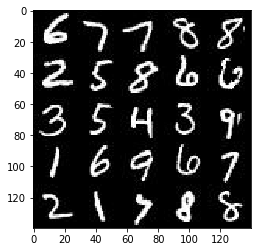

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

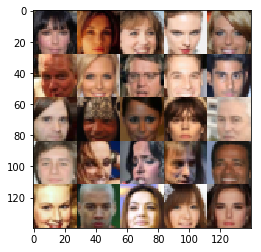

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    inputs_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name="input_real")
    inputs_z = tf.placeholder(tf.float32, [None, z_dim], name="input_z") 
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")
    
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 497, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/tornado/ioloop.py", line 832, in start\n    self._run_callback(self._callbacks.popleft())', 'File

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [15]:

def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """

    alpha = 0.2
    
        
    with tf.variable_scope('discriminator', reuse=reuse):
        
        
        # Input layer shape 28x28x3 
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same',  kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(seed=123))
        relu1 = tf.maximum(alpha * x1, x1) # relu1.shape: 14x14x64  
        drop1 = tf.nn.dropout(relu1, keep_prob=0.8)
                
        # Second convolution layer
        x2 = tf.layers.conv2d(drop1, 128, 5, strides=2, padding='same',  kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(seed=123))
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2) # relu2.shape: 7x7x128
        drop2 = tf.nn.dropout(relu2, keep_prob = 0.8)
                
        # Third convolution layer
        x3 = tf.layers.conv2d(drop2, 256, 5, strides=2, padding='same',  kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(seed=123))
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)  # relu3.shape: 4x4x256
        drop3 = tf.nn.dropout(relu3, keep_prob = 0.8)
              
        # Flatten it
        flat = tf.reshape(drop3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
                              
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [16]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse=not is_train):
        x1 = tf.layers.dense(z, 7*7*512)

        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
       
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
      

        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='same')
       
        out = tf.tanh(logits) 
   
    return out

  


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [17]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    smooth = 0.1 # label smoothing
    
    g_model = generator(input_z, out_channel_dim, is_train=True)
    
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1 - smooth)))
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
        
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [18]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [19]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [20]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    images_count, image_width, image_height, image_channels = data_shape
    
    input_real, input_z, learn_rate = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    print_every=10 
    show_every=100
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model      
                steps += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images *= 2
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, learn_rate: learning_rate})

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
              
            


                    print("Epoch {}/{}...".format(epoch_i + 1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.6453... Generator Loss: 1.9870
Epoch 1/2... Discriminator Loss: 1.3004... Generator Loss: 1.4422
Epoch 1/2... Discriminator Loss: 1.8377... Generator Loss: 3.9336
Epoch 1/2... Discriminator Loss: 2.1176... Generator Loss: 1.6760
Epoch 1/2... Discriminator Loss: 1.5623... Generator Loss: 0.5450
Epoch 1/2... Discriminator Loss: 1.6327... Generator Loss: 0.9631
Epoch 1/2... Discriminator Loss: 2.7281... Generator Loss: 2.1793
Epoch 1/2... Discriminator Loss: 1.6900... Generator Loss: 1.7189
Epoch 1/2... Discriminator Loss: 1.3515... Generator Loss: 1.3581
Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 0.9624


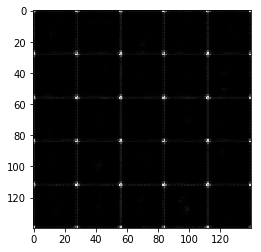

Epoch 1/2... Discriminator Loss: 1.7202... Generator Loss: 1.5406
Epoch 1/2... Discriminator Loss: 1.4581... Generator Loss: 1.3682
Epoch 1/2... Discriminator Loss: 1.8381... Generator Loss: 0.7628
Epoch 1/2... Discriminator Loss: 1.5664... Generator Loss: 0.5481
Epoch 1/2... Discriminator Loss: 1.8136... Generator Loss: 0.4596
Epoch 1/2... Discriminator Loss: 1.7316... Generator Loss: 0.8375
Epoch 1/2... Discriminator Loss: 1.3604... Generator Loss: 0.7897
Epoch 1/2... Discriminator Loss: 1.4582... Generator Loss: 1.0100
Epoch 1/2... Discriminator Loss: 1.6607... Generator Loss: 0.7137
Epoch 1/2... Discriminator Loss: 1.5210... Generator Loss: 0.8686


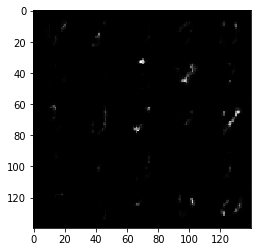

Epoch 1/2... Discriminator Loss: 1.5710... Generator Loss: 0.5895
Epoch 1/2... Discriminator Loss: 1.7324... Generator Loss: 0.4550
Epoch 1/2... Discriminator Loss: 1.5315... Generator Loss: 0.7867
Epoch 1/2... Discriminator Loss: 1.5795... Generator Loss: 0.7513
Epoch 1/2... Discriminator Loss: 1.3920... Generator Loss: 0.6309
Epoch 1/2... Discriminator Loss: 1.5815... Generator Loss: 0.8006
Epoch 1/2... Discriminator Loss: 1.2164... Generator Loss: 0.9333
Epoch 1/2... Discriminator Loss: 1.4458... Generator Loss: 0.9229
Epoch 1/2... Discriminator Loss: 1.5333... Generator Loss: 0.6123
Epoch 1/2... Discriminator Loss: 1.6745... Generator Loss: 0.8321


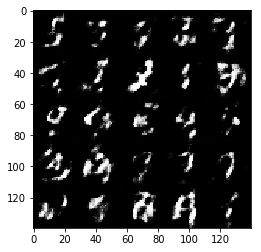

Epoch 1/2... Discriminator Loss: 1.4404... Generator Loss: 0.6897
Epoch 1/2... Discriminator Loss: 1.4703... Generator Loss: 0.9106
Epoch 1/2... Discriminator Loss: 1.5483... Generator Loss: 0.5496
Epoch 1/2... Discriminator Loss: 1.3755... Generator Loss: 0.8027
Epoch 1/2... Discriminator Loss: 1.3745... Generator Loss: 0.7844
Epoch 1/2... Discriminator Loss: 1.5790... Generator Loss: 0.5426
Epoch 1/2... Discriminator Loss: 1.5417... Generator Loss: 0.5483
Epoch 1/2... Discriminator Loss: 1.3746... Generator Loss: 0.9887
Epoch 1/2... Discriminator Loss: 1.4530... Generator Loss: 0.8834
Epoch 1/2... Discriminator Loss: 1.4745... Generator Loss: 1.1462


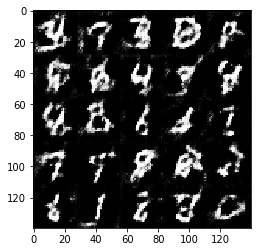

Epoch 1/2... Discriminator Loss: 1.2670... Generator Loss: 1.2396
Epoch 1/2... Discriminator Loss: 1.4231... Generator Loss: 0.7800
Epoch 1/2... Discriminator Loss: 1.6506... Generator Loss: 0.4914
Epoch 1/2... Discriminator Loss: 1.4854... Generator Loss: 0.7008
Epoch 1/2... Discriminator Loss: 1.7875... Generator Loss: 0.3245
Epoch 1/2... Discriminator Loss: 1.3888... Generator Loss: 0.9969
Epoch 1/2... Discriminator Loss: 1.6799... Generator Loss: 0.6177
Epoch 1/2... Discriminator Loss: 1.4123... Generator Loss: 0.7008
Epoch 1/2... Discriminator Loss: 1.4801... Generator Loss: 0.7323
Epoch 1/2... Discriminator Loss: 1.4641... Generator Loss: 0.6187


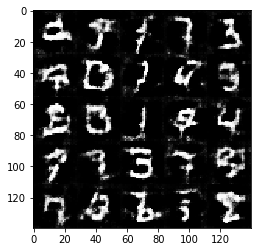

Epoch 1/2... Discriminator Loss: 1.5084... Generator Loss: 0.7979
Epoch 1/2... Discriminator Loss: 1.5027... Generator Loss: 0.4140
Epoch 1/2... Discriminator Loss: 1.1938... Generator Loss: 0.9202
Epoch 1/2... Discriminator Loss: 1.7847... Generator Loss: 0.4557
Epoch 1/2... Discriminator Loss: 1.5424... Generator Loss: 0.8725
Epoch 1/2... Discriminator Loss: 1.6611... Generator Loss: 0.4808
Epoch 1/2... Discriminator Loss: 1.4964... Generator Loss: 0.9473
Epoch 1/2... Discriminator Loss: 1.8699... Generator Loss: 0.3648
Epoch 1/2... Discriminator Loss: 1.3436... Generator Loss: 0.5858
Epoch 1/2... Discriminator Loss: 1.2073... Generator Loss: 0.7722


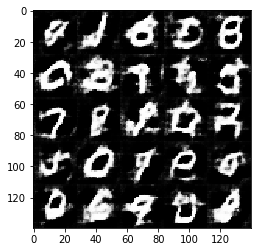

Epoch 1/2... Discriminator Loss: 1.5338... Generator Loss: 0.5325
Epoch 1/2... Discriminator Loss: 1.4301... Generator Loss: 1.0949
Epoch 1/2... Discriminator Loss: 1.5402... Generator Loss: 0.6513
Epoch 1/2... Discriminator Loss: 1.4102... Generator Loss: 0.7773
Epoch 1/2... Discriminator Loss: 1.3852... Generator Loss: 0.6080
Epoch 1/2... Discriminator Loss: 1.4581... Generator Loss: 0.5576
Epoch 1/2... Discriminator Loss: 1.4380... Generator Loss: 0.6373
Epoch 1/2... Discriminator Loss: 1.4469... Generator Loss: 0.5903
Epoch 1/2... Discriminator Loss: 1.5424... Generator Loss: 0.6760
Epoch 1/2... Discriminator Loss: 1.5167... Generator Loss: 0.4860


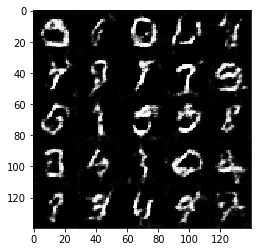

Epoch 1/2... Discriminator Loss: 1.2931... Generator Loss: 0.6859
Epoch 1/2... Discriminator Loss: 1.3000... Generator Loss: 0.9420
Epoch 1/2... Discriminator Loss: 1.4121... Generator Loss: 0.6366
Epoch 1/2... Discriminator Loss: 1.3564... Generator Loss: 0.8932
Epoch 1/2... Discriminator Loss: 1.1754... Generator Loss: 0.9665
Epoch 1/2... Discriminator Loss: 1.6489... Generator Loss: 0.5686
Epoch 1/2... Discriminator Loss: 1.3522... Generator Loss: 0.7679
Epoch 1/2... Discriminator Loss: 1.4237... Generator Loss: 0.7486
Epoch 1/2... Discriminator Loss: 1.4045... Generator Loss: 0.7363
Epoch 1/2... Discriminator Loss: 1.5921... Generator Loss: 0.5079


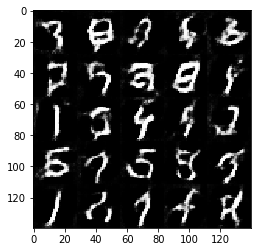

Epoch 1/2... Discriminator Loss: 1.2536... Generator Loss: 0.7559
Epoch 1/2... Discriminator Loss: 1.5498... Generator Loss: 0.4963
Epoch 1/2... Discriminator Loss: 1.4264... Generator Loss: 0.6380
Epoch 1/2... Discriminator Loss: 1.2939... Generator Loss: 0.8640
Epoch 1/2... Discriminator Loss: 1.3993... Generator Loss: 0.6263
Epoch 1/2... Discriminator Loss: 1.4843... Generator Loss: 0.7452
Epoch 1/2... Discriminator Loss: 1.3382... Generator Loss: 0.7764
Epoch 1/2... Discriminator Loss: 1.5098... Generator Loss: 0.8744
Epoch 1/2... Discriminator Loss: 1.3037... Generator Loss: 1.3412
Epoch 1/2... Discriminator Loss: 1.4904... Generator Loss: 0.6448


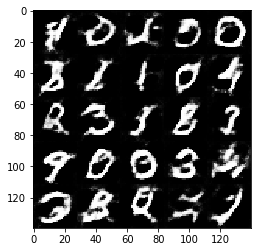

Epoch 1/2... Discriminator Loss: 1.1830... Generator Loss: 1.2003
Epoch 1/2... Discriminator Loss: 1.2863... Generator Loss: 1.0695
Epoch 1/2... Discriminator Loss: 1.4419... Generator Loss: 0.7233
Epoch 1/2... Discriminator Loss: 1.4343... Generator Loss: 0.5796
Epoch 1/2... Discriminator Loss: 1.4654... Generator Loss: 0.9000
Epoch 1/2... Discriminator Loss: 1.4386... Generator Loss: 0.8184
Epoch 1/2... Discriminator Loss: 1.5142... Generator Loss: 1.4750
Epoch 1/2... Discriminator Loss: 1.3080... Generator Loss: 0.6419
Epoch 1/2... Discriminator Loss: 1.3619... Generator Loss: 0.7133
Epoch 1/2... Discriminator Loss: 1.2366... Generator Loss: 0.6625


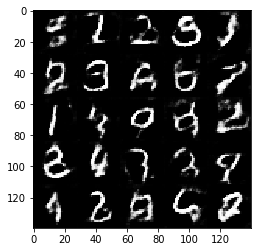

Epoch 1/2... Discriminator Loss: 1.3680... Generator Loss: 0.9240
Epoch 1/2... Discriminator Loss: 1.3666... Generator Loss: 0.8251
Epoch 1/2... Discriminator Loss: 1.2825... Generator Loss: 0.5883
Epoch 1/2... Discriminator Loss: 1.3733... Generator Loss: 0.9276
Epoch 1/2... Discriminator Loss: 1.4505... Generator Loss: 0.6071
Epoch 1/2... Discriminator Loss: 1.3973... Generator Loss: 1.0579
Epoch 1/2... Discriminator Loss: 1.3209... Generator Loss: 0.6611
Epoch 1/2... Discriminator Loss: 1.4829... Generator Loss: 0.5644
Epoch 1/2... Discriminator Loss: 1.2778... Generator Loss: 0.9596
Epoch 1/2... Discriminator Loss: 1.4633... Generator Loss: 0.9280


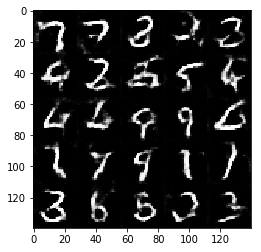

Epoch 1/2... Discriminator Loss: 1.6324... Generator Loss: 0.5339
Epoch 1/2... Discriminator Loss: 1.5119... Generator Loss: 0.7393
Epoch 1/2... Discriminator Loss: 1.1732... Generator Loss: 1.0628
Epoch 1/2... Discriminator Loss: 1.4325... Generator Loss: 0.7043
Epoch 1/2... Discriminator Loss: 1.5540... Generator Loss: 0.5601
Epoch 1/2... Discriminator Loss: 1.2221... Generator Loss: 0.7257
Epoch 1/2... Discriminator Loss: 1.5622... Generator Loss: 0.5781
Epoch 1/2... Discriminator Loss: 1.3289... Generator Loss: 0.7103
Epoch 1/2... Discriminator Loss: 1.1598... Generator Loss: 1.1197
Epoch 1/2... Discriminator Loss: 1.3632... Generator Loss: 0.7617


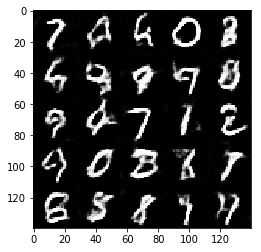

Epoch 1/2... Discriminator Loss: 1.2928... Generator Loss: 0.8105
Epoch 1/2... Discriminator Loss: 1.3132... Generator Loss: 1.1138
Epoch 1/2... Discriminator Loss: 1.3830... Generator Loss: 0.9843
Epoch 1/2... Discriminator Loss: 1.4155... Generator Loss: 0.6033
Epoch 1/2... Discriminator Loss: 1.3875... Generator Loss: 0.6954
Epoch 1/2... Discriminator Loss: 1.2133... Generator Loss: 0.9727
Epoch 1/2... Discriminator Loss: 1.2636... Generator Loss: 1.0300
Epoch 1/2... Discriminator Loss: 1.2582... Generator Loss: 0.9771
Epoch 1/2... Discriminator Loss: 1.4998... Generator Loss: 0.7579
Epoch 1/2... Discriminator Loss: 1.3371... Generator Loss: 0.6715


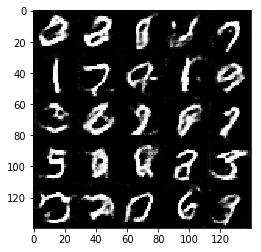

Epoch 1/2... Discriminator Loss: 1.4302... Generator Loss: 0.6530
Epoch 1/2... Discriminator Loss: 1.3276... Generator Loss: 0.5817
Epoch 1/2... Discriminator Loss: 1.3418... Generator Loss: 0.6092
Epoch 1/2... Discriminator Loss: 1.2717... Generator Loss: 1.0436
Epoch 1/2... Discriminator Loss: 1.3120... Generator Loss: 0.7862
Epoch 1/2... Discriminator Loss: 1.1942... Generator Loss: 0.7269
Epoch 1/2... Discriminator Loss: 1.6272... Generator Loss: 0.5200
Epoch 1/2... Discriminator Loss: 1.5809... Generator Loss: 0.5772
Epoch 1/2... Discriminator Loss: 1.4091... Generator Loss: 0.7278
Epoch 1/2... Discriminator Loss: 1.4168... Generator Loss: 0.7064


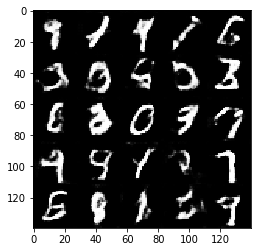

Epoch 1/2... Discriminator Loss: 1.3331... Generator Loss: 1.0801
Epoch 1/2... Discriminator Loss: 1.2952... Generator Loss: 0.7506
Epoch 1/2... Discriminator Loss: 1.2381... Generator Loss: 0.8178
Epoch 1/2... Discriminator Loss: 1.5445... Generator Loss: 0.7392
Epoch 1/2... Discriminator Loss: 1.2792... Generator Loss: 0.8898
Epoch 1/2... Discriminator Loss: 1.2507... Generator Loss: 0.9938
Epoch 1/2... Discriminator Loss: 1.3435... Generator Loss: 0.9858
Epoch 1/2... Discriminator Loss: 1.5061... Generator Loss: 1.6683
Epoch 1/2... Discriminator Loss: 1.2771... Generator Loss: 1.1026
Epoch 1/2... Discriminator Loss: 1.5171... Generator Loss: 0.4818


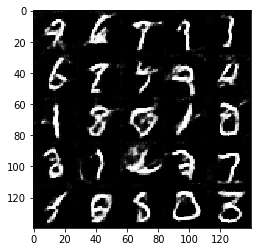

Epoch 1/2... Discriminator Loss: 1.4418... Generator Loss: 0.5711
Epoch 1/2... Discriminator Loss: 1.2415... Generator Loss: 0.8282
Epoch 1/2... Discriminator Loss: 1.3350... Generator Loss: 0.9385
Epoch 1/2... Discriminator Loss: 1.2509... Generator Loss: 0.6160
Epoch 1/2... Discriminator Loss: 1.5091... Generator Loss: 0.7110
Epoch 1/2... Discriminator Loss: 1.1962... Generator Loss: 1.0587
Epoch 1/2... Discriminator Loss: 1.3565... Generator Loss: 0.6319
Epoch 1/2... Discriminator Loss: 1.4059... Generator Loss: 0.6733
Epoch 1/2... Discriminator Loss: 1.4414... Generator Loss: 1.0202
Epoch 1/2... Discriminator Loss: 1.2189... Generator Loss: 0.7664


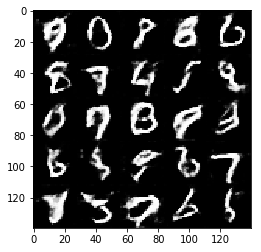

Epoch 1/2... Discriminator Loss: 1.3285... Generator Loss: 0.8991
Epoch 1/2... Discriminator Loss: 1.3334... Generator Loss: 0.5445
Epoch 1/2... Discriminator Loss: 1.4933... Generator Loss: 0.6077
Epoch 1/2... Discriminator Loss: 1.3625... Generator Loss: 0.6252
Epoch 1/2... Discriminator Loss: 1.4665... Generator Loss: 0.5263
Epoch 1/2... Discriminator Loss: 1.3774... Generator Loss: 0.7363
Epoch 1/2... Discriminator Loss: 1.3914... Generator Loss: 0.6485
Epoch 1/2... Discriminator Loss: 1.1828... Generator Loss: 1.0936
Epoch 1/2... Discriminator Loss: 1.3514... Generator Loss: 1.0065
Epoch 1/2... Discriminator Loss: 1.4136... Generator Loss: 0.9027


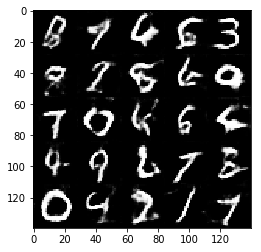

Epoch 1/2... Discriminator Loss: 1.2322... Generator Loss: 0.9372
Epoch 1/2... Discriminator Loss: 1.2804... Generator Loss: 0.9932
Epoch 1/2... Discriminator Loss: 1.5164... Generator Loss: 0.8495
Epoch 1/2... Discriminator Loss: 1.4392... Generator Loss: 1.2064
Epoch 1/2... Discriminator Loss: 1.2469... Generator Loss: 0.6265
Epoch 1/2... Discriminator Loss: 1.3807... Generator Loss: 1.1292
Epoch 1/2... Discriminator Loss: 1.3818... Generator Loss: 0.7006
Epoch 1/2... Discriminator Loss: 1.3898... Generator Loss: 0.7788
Epoch 1/2... Discriminator Loss: 1.5210... Generator Loss: 0.9711
Epoch 1/2... Discriminator Loss: 1.2478... Generator Loss: 1.0545


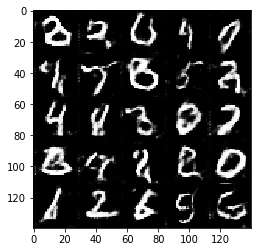

Epoch 1/2... Discriminator Loss: 1.4123... Generator Loss: 0.5271
Epoch 1/2... Discriminator Loss: 1.2420... Generator Loss: 0.6837
Epoch 1/2... Discriminator Loss: 1.2128... Generator Loss: 0.9708
Epoch 1/2... Discriminator Loss: 1.2225... Generator Loss: 0.9244
Epoch 1/2... Discriminator Loss: 1.1910... Generator Loss: 0.7483
Epoch 1/2... Discriminator Loss: 1.3955... Generator Loss: 1.3215
Epoch 1/2... Discriminator Loss: 1.0851... Generator Loss: 1.1620
Epoch 1/2... Discriminator Loss: 1.4318... Generator Loss: 0.5817
Epoch 1/2... Discriminator Loss: 1.4106... Generator Loss: 0.7463
Epoch 1/2... Discriminator Loss: 1.4425... Generator Loss: 0.6721


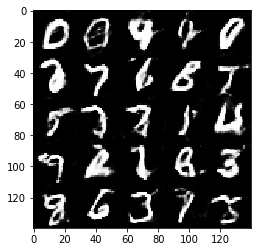

Epoch 1/2... Discriminator Loss: 1.4253... Generator Loss: 0.7390
Epoch 1/2... Discriminator Loss: 1.3614... Generator Loss: 0.6124
Epoch 1/2... Discriminator Loss: 1.1806... Generator Loss: 0.8382
Epoch 1/2... Discriminator Loss: 1.5643... Generator Loss: 0.6944
Epoch 1/2... Discriminator Loss: 1.3315... Generator Loss: 0.6396
Epoch 1/2... Discriminator Loss: 1.3526... Generator Loss: 0.6450
Epoch 1/2... Discriminator Loss: 1.1532... Generator Loss: 0.9431
Epoch 1/2... Discriminator Loss: 1.3970... Generator Loss: 0.7661
Epoch 1/2... Discriminator Loss: 1.2946... Generator Loss: 0.6032
Epoch 1/2... Discriminator Loss: 1.1474... Generator Loss: 0.9043


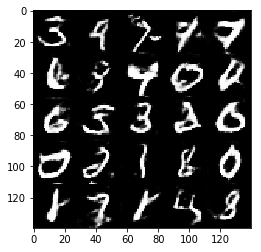

Epoch 1/2... Discriminator Loss: 1.1583... Generator Loss: 0.9587
Epoch 1/2... Discriminator Loss: 1.3907... Generator Loss: 1.1132
Epoch 1/2... Discriminator Loss: 1.2973... Generator Loss: 0.8501
Epoch 1/2... Discriminator Loss: 1.2985... Generator Loss: 0.8044
Epoch 1/2... Discriminator Loss: 1.1603... Generator Loss: 0.8778
Epoch 1/2... Discriminator Loss: 1.2525... Generator Loss: 0.9775
Epoch 1/2... Discriminator Loss: 1.2169... Generator Loss: 0.9807
Epoch 1/2... Discriminator Loss: 1.4524... Generator Loss: 0.7139
Epoch 1/2... Discriminator Loss: 1.2000... Generator Loss: 0.6812
Epoch 1/2... Discriminator Loss: 1.3314... Generator Loss: 0.9077


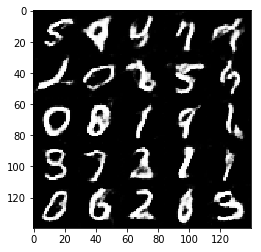

Epoch 1/2... Discriminator Loss: 1.0082... Generator Loss: 1.1955
Epoch 1/2... Discriminator Loss: 1.2646... Generator Loss: 0.4322
Epoch 1/2... Discriminator Loss: 1.1584... Generator Loss: 0.8446
Epoch 1/2... Discriminator Loss: 1.2274... Generator Loss: 0.7744
Epoch 1/2... Discriminator Loss: 1.4703... Generator Loss: 0.8608
Epoch 1/2... Discriminator Loss: 1.2340... Generator Loss: 0.7427
Epoch 1/2... Discriminator Loss: 1.2365... Generator Loss: 0.8484
Epoch 1/2... Discriminator Loss: 1.4464... Generator Loss: 1.0229
Epoch 1/2... Discriminator Loss: 1.5793... Generator Loss: 0.6494
Epoch 1/2... Discriminator Loss: 1.3412... Generator Loss: 1.0703


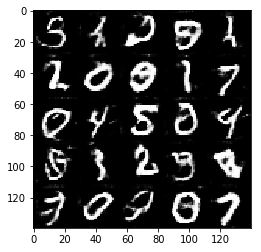

Epoch 1/2... Discriminator Loss: 1.3169... Generator Loss: 0.8343
Epoch 1/2... Discriminator Loss: 1.2279... Generator Loss: 0.7386
Epoch 1/2... Discriminator Loss: 1.1973... Generator Loss: 1.0824
Epoch 1/2... Discriminator Loss: 1.1946... Generator Loss: 0.8382
Epoch 1/2... Discriminator Loss: 1.3492... Generator Loss: 0.5611
Epoch 1/2... Discriminator Loss: 1.1352... Generator Loss: 0.8557
Epoch 1/2... Discriminator Loss: 1.4048... Generator Loss: 0.6801
Epoch 1/2... Discriminator Loss: 1.3478... Generator Loss: 0.6500
Epoch 1/2... Discriminator Loss: 1.2751... Generator Loss: 0.6433
Epoch 1/2... Discriminator Loss: 1.4052... Generator Loss: 1.0880


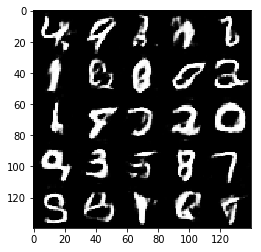

Epoch 1/2... Discriminator Loss: 1.3793... Generator Loss: 0.7975
Epoch 1/2... Discriminator Loss: 1.1251... Generator Loss: 1.1779
Epoch 1/2... Discriminator Loss: 1.1417... Generator Loss: 0.9250
Epoch 1/2... Discriminator Loss: 1.2741... Generator Loss: 1.0284
Epoch 1/2... Discriminator Loss: 1.4657... Generator Loss: 0.6361
Epoch 1/2... Discriminator Loss: 1.2264... Generator Loss: 1.0126
Epoch 1/2... Discriminator Loss: 1.2240... Generator Loss: 0.8032
Epoch 1/2... Discriminator Loss: 1.2290... Generator Loss: 0.8934
Epoch 1/2... Discriminator Loss: 1.3036... Generator Loss: 1.1933
Epoch 1/2... Discriminator Loss: 1.2734... Generator Loss: 0.8601


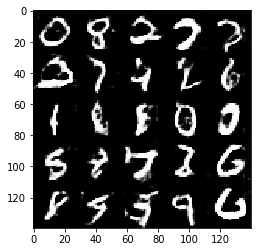

Epoch 1/2... Discriminator Loss: 1.1969... Generator Loss: 0.7914
Epoch 1/2... Discriminator Loss: 1.2412... Generator Loss: 0.6133
Epoch 1/2... Discriminator Loss: 1.5855... Generator Loss: 0.4878
Epoch 1/2... Discriminator Loss: 0.9818... Generator Loss: 1.2629
Epoch 1/2... Discriminator Loss: 1.6745... Generator Loss: 1.9654
Epoch 1/2... Discriminator Loss: 1.3315... Generator Loss: 0.7920
Epoch 1/2... Discriminator Loss: 1.2514... Generator Loss: 0.6867
Epoch 1/2... Discriminator Loss: 1.7539... Generator Loss: 0.4256
Epoch 1/2... Discriminator Loss: 1.1716... Generator Loss: 1.4111
Epoch 1/2... Discriminator Loss: 1.1781... Generator Loss: 1.2069


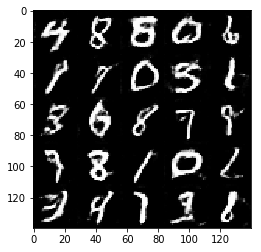

Epoch 1/2... Discriminator Loss: 1.3599... Generator Loss: 0.4922
Epoch 1/2... Discriminator Loss: 1.6190... Generator Loss: 0.7836
Epoch 1/2... Discriminator Loss: 1.3872... Generator Loss: 0.6700
Epoch 1/2... Discriminator Loss: 1.3804... Generator Loss: 0.7124
Epoch 1/2... Discriminator Loss: 1.5622... Generator Loss: 0.8847
Epoch 1/2... Discriminator Loss: 1.4937... Generator Loss: 0.6790
Epoch 1/2... Discriminator Loss: 1.2498... Generator Loss: 0.6674
Epoch 1/2... Discriminator Loss: 1.2549... Generator Loss: 0.9471
Epoch 1/2... Discriminator Loss: 1.3438... Generator Loss: 1.2794
Epoch 1/2... Discriminator Loss: 1.1616... Generator Loss: 0.9204


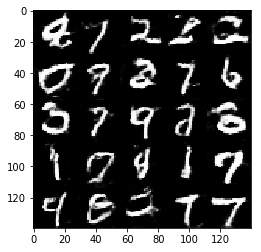

Epoch 1/2... Discriminator Loss: 1.2894... Generator Loss: 1.6391
Epoch 1/2... Discriminator Loss: 1.1827... Generator Loss: 0.9737
Epoch 1/2... Discriminator Loss: 1.1032... Generator Loss: 1.1646
Epoch 1/2... Discriminator Loss: 1.2219... Generator Loss: 1.1399
Epoch 1/2... Discriminator Loss: 1.2872... Generator Loss: 0.8156
Epoch 1/2... Discriminator Loss: 1.2443... Generator Loss: 1.3153
Epoch 1/2... Discriminator Loss: 1.3151... Generator Loss: 0.6502
Epoch 1/2... Discriminator Loss: 0.9136... Generator Loss: 1.3571
Epoch 1/2... Discriminator Loss: 1.2683... Generator Loss: 0.8506
Epoch 1/2... Discriminator Loss: 1.2161... Generator Loss: 1.1557


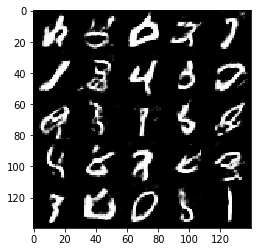

Epoch 1/2... Discriminator Loss: 1.1178... Generator Loss: 0.6424
Epoch 1/2... Discriminator Loss: 1.3736... Generator Loss: 0.9265
Epoch 1/2... Discriminator Loss: 1.2878... Generator Loss: 0.7430
Epoch 1/2... Discriminator Loss: 1.1982... Generator Loss: 0.7835
Epoch 1/2... Discriminator Loss: 1.2955... Generator Loss: 0.6868
Epoch 1/2... Discriminator Loss: 1.2125... Generator Loss: 1.2067
Epoch 1/2... Discriminator Loss: 1.1935... Generator Loss: 1.0655
Epoch 1/2... Discriminator Loss: 1.3395... Generator Loss: 0.7375
Epoch 1/2... Discriminator Loss: 1.3205... Generator Loss: 0.8258
Epoch 1/2... Discriminator Loss: 1.3655... Generator Loss: 0.5740


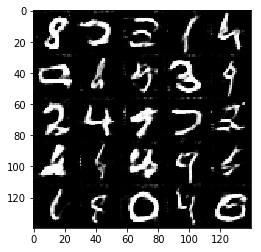

Epoch 1/2... Discriminator Loss: 1.4219... Generator Loss: 0.5596
Epoch 1/2... Discriminator Loss: 1.0307... Generator Loss: 1.4453
Epoch 1/2... Discriminator Loss: 1.2397... Generator Loss: 1.2082
Epoch 1/2... Discriminator Loss: 1.7455... Generator Loss: 0.3853
Epoch 1/2... Discriminator Loss: 1.3277... Generator Loss: 0.9782
Epoch 1/2... Discriminator Loss: 1.2216... Generator Loss: 0.6855
Epoch 1/2... Discriminator Loss: 1.2755... Generator Loss: 0.5859
Epoch 1/2... Discriminator Loss: 1.4700... Generator Loss: 0.7415
Epoch 1/2... Discriminator Loss: 1.4754... Generator Loss: 0.5431
Epoch 1/2... Discriminator Loss: 1.0949... Generator Loss: 0.9690


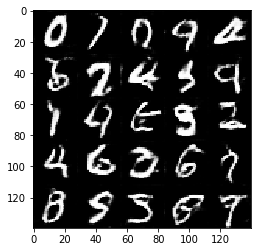

Epoch 1/2... Discriminator Loss: 1.0079... Generator Loss: 0.8466
Epoch 1/2... Discriminator Loss: 1.0621... Generator Loss: 0.7812
Epoch 1/2... Discriminator Loss: 1.0557... Generator Loss: 0.8412
Epoch 1/2... Discriminator Loss: 1.1656... Generator Loss: 1.0213
Epoch 1/2... Discriminator Loss: 1.2353... Generator Loss: 0.8093
Epoch 1/2... Discriminator Loss: 1.0975... Generator Loss: 0.7701
Epoch 1/2... Discriminator Loss: 1.1880... Generator Loss: 0.9112
Epoch 1/2... Discriminator Loss: 1.1284... Generator Loss: 0.8750
Epoch 1/2... Discriminator Loss: 1.2698... Generator Loss: 0.5969
Epoch 1/2... Discriminator Loss: 1.8746... Generator Loss: 0.3668


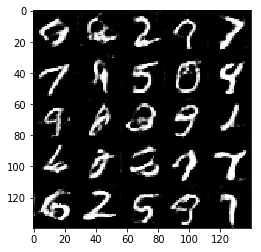

Epoch 1/2... Discriminator Loss: 1.2747... Generator Loss: 0.7073
Epoch 1/2... Discriminator Loss: 1.0643... Generator Loss: 1.1879
Epoch 1/2... Discriminator Loss: 1.3060... Generator Loss: 1.1176
Epoch 1/2... Discriminator Loss: 1.1409... Generator Loss: 1.4549
Epoch 1/2... Discriminator Loss: 1.3159... Generator Loss: 1.2306
Epoch 1/2... Discriminator Loss: 0.8423... Generator Loss: 1.3637
Epoch 1/2... Discriminator Loss: 1.3898... Generator Loss: 0.8501
Epoch 1/2... Discriminator Loss: 1.3447... Generator Loss: 1.2103
Epoch 1/2... Discriminator Loss: 1.0817... Generator Loss: 0.9139
Epoch 1/2... Discriminator Loss: 0.9278... Generator Loss: 1.1674


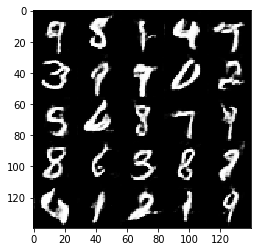

Epoch 1/2... Discriminator Loss: 1.3167... Generator Loss: 0.6591
Epoch 1/2... Discriminator Loss: 1.1912... Generator Loss: 1.1224
Epoch 1/2... Discriminator Loss: 1.2333... Generator Loss: 0.8081
Epoch 1/2... Discriminator Loss: 1.0232... Generator Loss: 1.1027
Epoch 1/2... Discriminator Loss: 0.9220... Generator Loss: 1.3643
Epoch 1/2... Discriminator Loss: 1.0374... Generator Loss: 0.8735
Epoch 1/2... Discriminator Loss: 1.1595... Generator Loss: 0.8802
Epoch 1/2... Discriminator Loss: 1.0553... Generator Loss: 1.0096
Epoch 1/2... Discriminator Loss: 0.9927... Generator Loss: 1.2998
Epoch 1/2... Discriminator Loss: 1.2292... Generator Loss: 0.7200


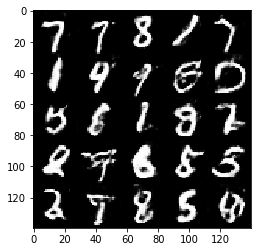

Epoch 1/2... Discriminator Loss: 1.1348... Generator Loss: 0.8681
Epoch 1/2... Discriminator Loss: 1.3215... Generator Loss: 0.5879
Epoch 1/2... Discriminator Loss: 1.0267... Generator Loss: 1.0373
Epoch 1/2... Discriminator Loss: 1.0139... Generator Loss: 0.9232
Epoch 1/2... Discriminator Loss: 1.1284... Generator Loss: 0.8480
Epoch 1/2... Discriminator Loss: 1.7412... Generator Loss: 0.4773
Epoch 1/2... Discriminator Loss: 1.4499... Generator Loss: 0.5693
Epoch 1/2... Discriminator Loss: 1.0612... Generator Loss: 1.3792
Epoch 1/2... Discriminator Loss: 0.9325... Generator Loss: 0.6986
Epoch 1/2... Discriminator Loss: 1.1838... Generator Loss: 0.9001


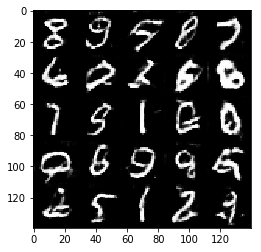

Epoch 1/2... Discriminator Loss: 1.1507... Generator Loss: 1.4868
Epoch 1/2... Discriminator Loss: 1.2593... Generator Loss: 1.2073
Epoch 1/2... Discriminator Loss: 1.3902... Generator Loss: 0.7335
Epoch 1/2... Discriminator Loss: 1.1725... Generator Loss: 1.1380
Epoch 1/2... Discriminator Loss: 1.2556... Generator Loss: 0.5521
Epoch 1/2... Discriminator Loss: 1.4467... Generator Loss: 0.4384
Epoch 1/2... Discriminator Loss: 1.2504... Generator Loss: 0.7711
Epoch 1/2... Discriminator Loss: 1.1488... Generator Loss: 0.9172
Epoch 1/2... Discriminator Loss: 1.2585... Generator Loss: 0.6251
Epoch 1/2... Discriminator Loss: 1.1804... Generator Loss: 0.7444


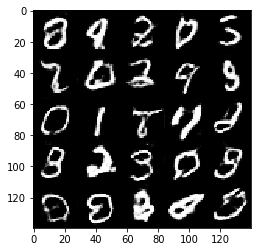

Epoch 1/2... Discriminator Loss: 1.3956... Generator Loss: 0.6982
Epoch 1/2... Discriminator Loss: 1.7389... Generator Loss: 0.4651
Epoch 1/2... Discriminator Loss: 1.1339... Generator Loss: 1.2250
Epoch 1/2... Discriminator Loss: 1.0026... Generator Loss: 0.8998
Epoch 1/2... Discriminator Loss: 1.2254... Generator Loss: 1.4282
Epoch 1/2... Discriminator Loss: 1.3115... Generator Loss: 0.8718
Epoch 1/2... Discriminator Loss: 1.1723... Generator Loss: 1.2521
Epoch 1/2... Discriminator Loss: 0.8460... Generator Loss: 1.6286
Epoch 1/2... Discriminator Loss: 1.4449... Generator Loss: 0.7645
Epoch 1/2... Discriminator Loss: 1.2177... Generator Loss: 0.7462


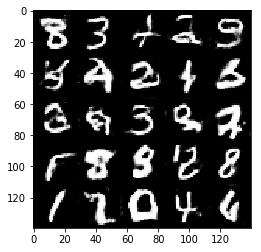

Epoch 1/2... Discriminator Loss: 1.2261... Generator Loss: 0.6539
Epoch 1/2... Discriminator Loss: 1.1889... Generator Loss: 0.9851
Epoch 1/2... Discriminator Loss: 0.9586... Generator Loss: 1.0184
Epoch 1/2... Discriminator Loss: 1.0619... Generator Loss: 1.2636
Epoch 1/2... Discriminator Loss: 1.0280... Generator Loss: 1.0890
Epoch 1/2... Discriminator Loss: 0.8760... Generator Loss: 1.3219
Epoch 1/2... Discriminator Loss: 1.0361... Generator Loss: 1.2915
Epoch 1/2... Discriminator Loss: 1.0938... Generator Loss: 1.3778
Epoch 1/2... Discriminator Loss: 1.3080... Generator Loss: 1.0826
Epoch 1/2... Discriminator Loss: 1.0784... Generator Loss: 1.0605


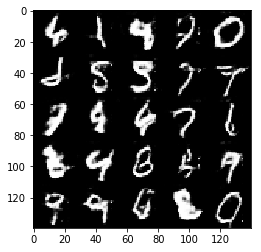

Epoch 1/2... Discriminator Loss: 1.1157... Generator Loss: 1.6085
Epoch 1/2... Discriminator Loss: 1.1848... Generator Loss: 0.6926
Epoch 1/2... Discriminator Loss: 1.3162... Generator Loss: 0.8322
Epoch 1/2... Discriminator Loss: 1.1119... Generator Loss: 1.6602
Epoch 1/2... Discriminator Loss: 1.4654... Generator Loss: 0.5030
Epoch 1/2... Discriminator Loss: 1.3183... Generator Loss: 0.5988
Epoch 1/2... Discriminator Loss: 1.4956... Generator Loss: 0.8840
Epoch 1/2... Discriminator Loss: 1.2892... Generator Loss: 0.9976
Epoch 1/2... Discriminator Loss: 1.2153... Generator Loss: 0.7530
Epoch 1/2... Discriminator Loss: 0.8747... Generator Loss: 1.6923


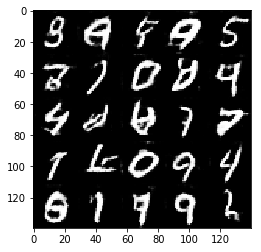

Epoch 1/2... Discriminator Loss: 1.1459... Generator Loss: 0.9851
Epoch 1/2... Discriminator Loss: 1.1048... Generator Loss: 1.0603
Epoch 1/2... Discriminator Loss: 1.2577... Generator Loss: 0.8665
Epoch 1/2... Discriminator Loss: 0.9396... Generator Loss: 1.3063
Epoch 1/2... Discriminator Loss: 1.2576... Generator Loss: 0.8866
Epoch 2/2... Discriminator Loss: 1.5520... Generator Loss: 0.5093
Epoch 2/2... Discriminator Loss: 1.0168... Generator Loss: 0.8360
Epoch 2/2... Discriminator Loss: 1.1563... Generator Loss: 0.8509
Epoch 2/2... Discriminator Loss: 1.1506... Generator Loss: 2.0078
Epoch 2/2... Discriminator Loss: 0.8236... Generator Loss: 1.2410


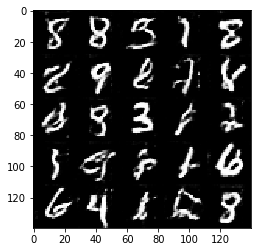

Epoch 2/2... Discriminator Loss: 1.2392... Generator Loss: 0.8861
Epoch 2/2... Discriminator Loss: 1.0603... Generator Loss: 1.3913
Epoch 2/2... Discriminator Loss: 1.0859... Generator Loss: 0.8854
Epoch 2/2... Discriminator Loss: 0.8934... Generator Loss: 0.9602
Epoch 2/2... Discriminator Loss: 1.0087... Generator Loss: 0.7151
Epoch 2/2... Discriminator Loss: 0.9626... Generator Loss: 1.3650
Epoch 2/2... Discriminator Loss: 1.3702... Generator Loss: 1.4390
Epoch 2/2... Discriminator Loss: 1.2073... Generator Loss: 0.7415
Epoch 2/2... Discriminator Loss: 1.0530... Generator Loss: 0.7896
Epoch 2/2... Discriminator Loss: 1.2698... Generator Loss: 0.6984


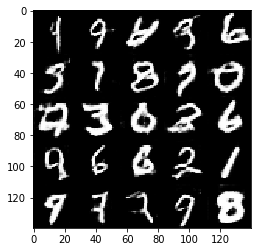

Epoch 2/2... Discriminator Loss: 1.0925... Generator Loss: 1.3536
Epoch 2/2... Discriminator Loss: 1.1807... Generator Loss: 0.6169
Epoch 2/2... Discriminator Loss: 1.0503... Generator Loss: 1.9815
Epoch 2/2... Discriminator Loss: 0.8283... Generator Loss: 1.8879
Epoch 2/2... Discriminator Loss: 1.1169... Generator Loss: 1.2939
Epoch 2/2... Discriminator Loss: 1.1589... Generator Loss: 0.8526
Epoch 2/2... Discriminator Loss: 1.1769... Generator Loss: 0.8231
Epoch 2/2... Discriminator Loss: 1.2756... Generator Loss: 1.1411
Epoch 2/2... Discriminator Loss: 1.0185... Generator Loss: 0.9657
Epoch 2/2... Discriminator Loss: 0.8671... Generator Loss: 1.0158


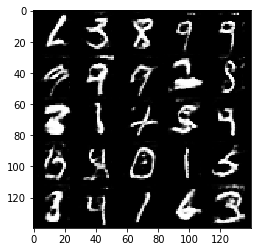

Epoch 2/2... Discriminator Loss: 1.1963... Generator Loss: 1.2023
Epoch 2/2... Discriminator Loss: 1.6362... Generator Loss: 0.6106
Epoch 2/2... Discriminator Loss: 1.3304... Generator Loss: 1.0603
Epoch 2/2... Discriminator Loss: 0.8442... Generator Loss: 1.2639
Epoch 2/2... Discriminator Loss: 0.9706... Generator Loss: 1.2557
Epoch 2/2... Discriminator Loss: 1.0545... Generator Loss: 0.8736
Epoch 2/2... Discriminator Loss: 1.3169... Generator Loss: 1.3800
Epoch 2/2... Discriminator Loss: 0.9542... Generator Loss: 1.0131
Epoch 2/2... Discriminator Loss: 1.7781... Generator Loss: 0.3016
Epoch 2/2... Discriminator Loss: 0.9674... Generator Loss: 1.2811


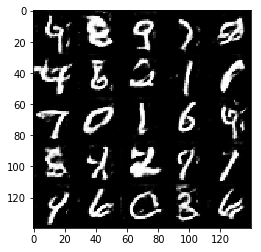

Epoch 2/2... Discriminator Loss: 1.0721... Generator Loss: 0.8925
Epoch 2/2... Discriminator Loss: 1.0568... Generator Loss: 1.1840
Epoch 2/2... Discriminator Loss: 1.2856... Generator Loss: 0.9163
Epoch 2/2... Discriminator Loss: 1.1955... Generator Loss: 1.7275
Epoch 2/2... Discriminator Loss: 1.3801... Generator Loss: 1.4129
Epoch 2/2... Discriminator Loss: 1.0035... Generator Loss: 1.1151
Epoch 2/2... Discriminator Loss: 0.9955... Generator Loss: 1.0954
Epoch 2/2... Discriminator Loss: 1.2356... Generator Loss: 1.0174
Epoch 2/2... Discriminator Loss: 1.0926... Generator Loss: 1.1759
Epoch 2/2... Discriminator Loss: 1.1364... Generator Loss: 0.6868


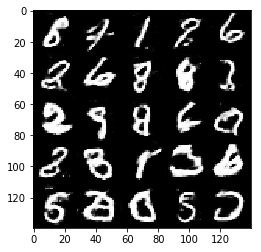

Epoch 2/2... Discriminator Loss: 1.0411... Generator Loss: 1.2066
Epoch 2/2... Discriminator Loss: 1.2949... Generator Loss: 1.4724
Epoch 2/2... Discriminator Loss: 1.1070... Generator Loss: 1.0959
Epoch 2/2... Discriminator Loss: 1.4655... Generator Loss: 0.6803
Epoch 2/2... Discriminator Loss: 1.6502... Generator Loss: 1.1388
Epoch 2/2... Discriminator Loss: 1.0890... Generator Loss: 1.3241
Epoch 2/2... Discriminator Loss: 1.1449... Generator Loss: 0.7561
Epoch 2/2... Discriminator Loss: 1.1222... Generator Loss: 1.4730
Epoch 2/2... Discriminator Loss: 1.2647... Generator Loss: 0.6906
Epoch 2/2... Discriminator Loss: 1.0113... Generator Loss: 1.0140


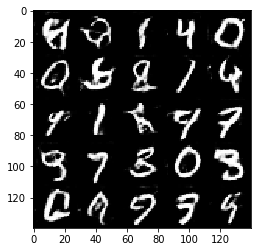

Epoch 2/2... Discriminator Loss: 1.2759... Generator Loss: 0.9621
Epoch 2/2... Discriminator Loss: 1.1885... Generator Loss: 0.9528
Epoch 2/2... Discriminator Loss: 1.2037... Generator Loss: 0.7536
Epoch 2/2... Discriminator Loss: 0.8781... Generator Loss: 1.3382
Epoch 2/2... Discriminator Loss: 1.0614... Generator Loss: 1.0203
Epoch 2/2... Discriminator Loss: 1.2156... Generator Loss: 1.2102
Epoch 2/2... Discriminator Loss: 0.9343... Generator Loss: 1.2878
Epoch 2/2... Discriminator Loss: 1.2786... Generator Loss: 0.8767
Epoch 2/2... Discriminator Loss: 1.1756... Generator Loss: 1.0859
Epoch 2/2... Discriminator Loss: 1.2577... Generator Loss: 0.8383


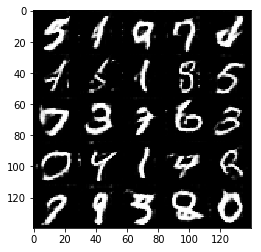

Epoch 2/2... Discriminator Loss: 1.3112... Generator Loss: 0.8610
Epoch 2/2... Discriminator Loss: 0.8264... Generator Loss: 0.9631
Epoch 2/2... Discriminator Loss: 1.2798... Generator Loss: 0.7864
Epoch 2/2... Discriminator Loss: 1.2500... Generator Loss: 1.1452
Epoch 2/2... Discriminator Loss: 1.4485... Generator Loss: 1.9210
Epoch 2/2... Discriminator Loss: 1.0198... Generator Loss: 1.1259
Epoch 2/2... Discriminator Loss: 1.2828... Generator Loss: 0.9508
Epoch 2/2... Discriminator Loss: 1.2415... Generator Loss: 0.8921
Epoch 2/2... Discriminator Loss: 0.8847... Generator Loss: 0.7887
Epoch 2/2... Discriminator Loss: 0.7317... Generator Loss: 1.4165


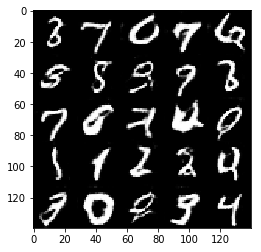

Epoch 2/2... Discriminator Loss: 1.4595... Generator Loss: 1.3625
Epoch 2/2... Discriminator Loss: 1.1105... Generator Loss: 1.4303
Epoch 2/2... Discriminator Loss: 0.9775... Generator Loss: 0.9022
Epoch 2/2... Discriminator Loss: 0.8800... Generator Loss: 1.5140
Epoch 2/2... Discriminator Loss: 0.7883... Generator Loss: 1.7355
Epoch 2/2... Discriminator Loss: 1.1636... Generator Loss: 0.7759
Epoch 2/2... Discriminator Loss: 1.1625... Generator Loss: 1.1613
Epoch 2/2... Discriminator Loss: 1.2596... Generator Loss: 0.7592
Epoch 2/2... Discriminator Loss: 1.1635... Generator Loss: 1.2568
Epoch 2/2... Discriminator Loss: 1.2660... Generator Loss: 1.0021


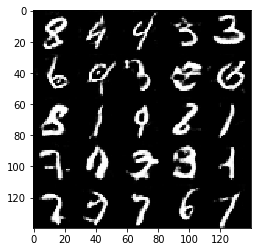

Epoch 2/2... Discriminator Loss: 1.4047... Generator Loss: 0.5291
Epoch 2/2... Discriminator Loss: 1.0846... Generator Loss: 1.1780
Epoch 2/2... Discriminator Loss: 0.9827... Generator Loss: 1.3625
Epoch 2/2... Discriminator Loss: 1.0554... Generator Loss: 1.1238
Epoch 2/2... Discriminator Loss: 1.0252... Generator Loss: 0.8012
Epoch 2/2... Discriminator Loss: 0.8814... Generator Loss: 1.1466
Epoch 2/2... Discriminator Loss: 1.4395... Generator Loss: 0.9550
Epoch 2/2... Discriminator Loss: 1.0210... Generator Loss: 1.1876
Epoch 2/2... Discriminator Loss: 1.1141... Generator Loss: 0.8611
Epoch 2/2... Discriminator Loss: 1.5918... Generator Loss: 0.5366


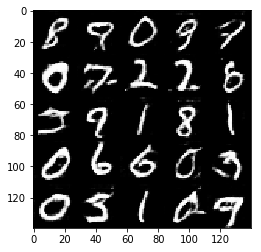

Epoch 2/2... Discriminator Loss: 1.4033... Generator Loss: 0.5563
Epoch 2/2... Discriminator Loss: 0.9246... Generator Loss: 1.1667
Epoch 2/2... Discriminator Loss: 0.9755... Generator Loss: 1.0192
Epoch 2/2... Discriminator Loss: 0.9944... Generator Loss: 0.9324
Epoch 2/2... Discriminator Loss: 0.8498... Generator Loss: 1.5037
Epoch 2/2... Discriminator Loss: 1.0801... Generator Loss: 0.8248
Epoch 2/2... Discriminator Loss: 1.0694... Generator Loss: 0.9016
Epoch 2/2... Discriminator Loss: 1.6944... Generator Loss: 0.4182
Epoch 2/2... Discriminator Loss: 1.0391... Generator Loss: 0.9934
Epoch 2/2... Discriminator Loss: 1.0937... Generator Loss: 0.9760


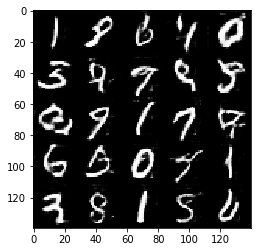

Epoch 2/2... Discriminator Loss: 1.0953... Generator Loss: 0.7957
Epoch 2/2... Discriminator Loss: 1.1747... Generator Loss: 1.0717
Epoch 2/2... Discriminator Loss: 1.0516... Generator Loss: 1.4968
Epoch 2/2... Discriminator Loss: 1.0553... Generator Loss: 0.8451
Epoch 2/2... Discriminator Loss: 0.8876... Generator Loss: 1.6051
Epoch 2/2... Discriminator Loss: 1.1946... Generator Loss: 1.7990
Epoch 2/2... Discriminator Loss: 0.9363... Generator Loss: 1.6374
Epoch 2/2... Discriminator Loss: 1.0654... Generator Loss: 1.8393
Epoch 2/2... Discriminator Loss: 1.1754... Generator Loss: 2.0047
Epoch 2/2... Discriminator Loss: 0.8365... Generator Loss: 1.1997


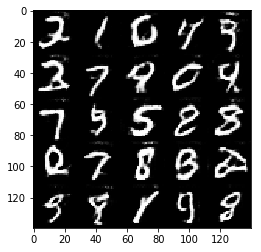

Epoch 2/2... Discriminator Loss: 0.8167... Generator Loss: 1.5636
Epoch 2/2... Discriminator Loss: 1.3329... Generator Loss: 0.7404
Epoch 2/2... Discriminator Loss: 1.1660... Generator Loss: 0.6355
Epoch 2/2... Discriminator Loss: 0.9990... Generator Loss: 1.7623
Epoch 2/2... Discriminator Loss: 0.8958... Generator Loss: 0.7318
Epoch 2/2... Discriminator Loss: 1.0072... Generator Loss: 1.2583
Epoch 2/2... Discriminator Loss: 1.0885... Generator Loss: 1.2034
Epoch 2/2... Discriminator Loss: 1.0616... Generator Loss: 1.1784
Epoch 2/2... Discriminator Loss: 1.3264... Generator Loss: 0.5400
Epoch 2/2... Discriminator Loss: 1.3725... Generator Loss: 1.2275


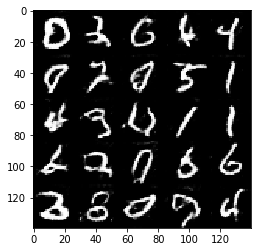

Epoch 2/2... Discriminator Loss: 0.8346... Generator Loss: 1.7778
Epoch 2/2... Discriminator Loss: 0.9064... Generator Loss: 0.8196
Epoch 2/2... Discriminator Loss: 0.8894... Generator Loss: 1.3437
Epoch 2/2... Discriminator Loss: 0.8922... Generator Loss: 0.8491
Epoch 2/2... Discriminator Loss: 1.2618... Generator Loss: 0.8695
Epoch 2/2... Discriminator Loss: 1.0130... Generator Loss: 1.8140
Epoch 2/2... Discriminator Loss: 1.0155... Generator Loss: 0.6552
Epoch 2/2... Discriminator Loss: 0.7991... Generator Loss: 1.4402
Epoch 2/2... Discriminator Loss: 0.8937... Generator Loss: 1.4834
Epoch 2/2... Discriminator Loss: 1.5378... Generator Loss: 0.7386


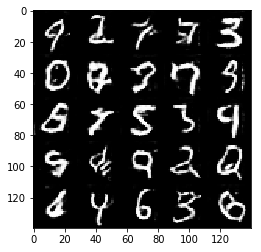

Epoch 2/2... Discriminator Loss: 0.8479... Generator Loss: 1.3728
Epoch 2/2... Discriminator Loss: 1.8944... Generator Loss: 0.4617
Epoch 2/2... Discriminator Loss: 1.1488... Generator Loss: 0.9961
Epoch 2/2... Discriminator Loss: 0.8655... Generator Loss: 1.6046
Epoch 2/2... Discriminator Loss: 1.0524... Generator Loss: 0.7771
Epoch 2/2... Discriminator Loss: 0.8790... Generator Loss: 1.1825
Epoch 2/2... Discriminator Loss: 1.1794... Generator Loss: 0.8263
Epoch 2/2... Discriminator Loss: 1.3371... Generator Loss: 1.0066
Epoch 2/2... Discriminator Loss: 0.9470... Generator Loss: 1.4163
Epoch 2/2... Discriminator Loss: 1.2897... Generator Loss: 0.8287


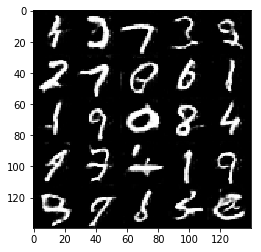

Epoch 2/2... Discriminator Loss: 1.0603... Generator Loss: 1.2016
Epoch 2/2... Discriminator Loss: 1.0339... Generator Loss: 1.7322
Epoch 2/2... Discriminator Loss: 1.3696... Generator Loss: 1.7253
Epoch 2/2... Discriminator Loss: 1.2423... Generator Loss: 1.2013
Epoch 2/2... Discriminator Loss: 1.1137... Generator Loss: 0.7397
Epoch 2/2... Discriminator Loss: 1.1336... Generator Loss: 1.4355
Epoch 2/2... Discriminator Loss: 1.3071... Generator Loss: 1.3953
Epoch 2/2... Discriminator Loss: 1.3344... Generator Loss: 0.8781
Epoch 2/2... Discriminator Loss: 1.0210... Generator Loss: 1.0149
Epoch 2/2... Discriminator Loss: 1.0362... Generator Loss: 1.5122


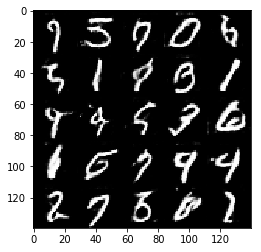

Epoch 2/2... Discriminator Loss: 0.6807... Generator Loss: 1.4472
Epoch 2/2... Discriminator Loss: 1.1325... Generator Loss: 1.1065
Epoch 2/2... Discriminator Loss: 0.8198... Generator Loss: 1.0297
Epoch 2/2... Discriminator Loss: 1.3847... Generator Loss: 1.7930
Epoch 2/2... Discriminator Loss: 1.2011... Generator Loss: 1.3283
Epoch 2/2... Discriminator Loss: 0.9485... Generator Loss: 1.4413
Epoch 2/2... Discriminator Loss: 1.2079... Generator Loss: 0.8242
Epoch 2/2... Discriminator Loss: 1.0107... Generator Loss: 1.0251
Epoch 2/2... Discriminator Loss: 1.4096... Generator Loss: 0.5074
Epoch 2/2... Discriminator Loss: 1.8080... Generator Loss: 0.3854


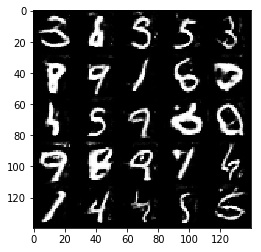

Epoch 2/2... Discriminator Loss: 1.6151... Generator Loss: 0.3168
Epoch 2/2... Discriminator Loss: 1.3066... Generator Loss: 1.0112
Epoch 2/2... Discriminator Loss: 0.9708... Generator Loss: 0.8949
Epoch 2/2... Discriminator Loss: 0.9104... Generator Loss: 1.2914
Epoch 2/2... Discriminator Loss: 0.8690... Generator Loss: 1.1697
Epoch 2/2... Discriminator Loss: 0.7850... Generator Loss: 1.1492
Epoch 2/2... Discriminator Loss: 1.4229... Generator Loss: 1.2735
Epoch 2/2... Discriminator Loss: 1.0409... Generator Loss: 1.8181
Epoch 2/2... Discriminator Loss: 0.8893... Generator Loss: 1.0923
Epoch 2/2... Discriminator Loss: 1.7411... Generator Loss: 0.7193


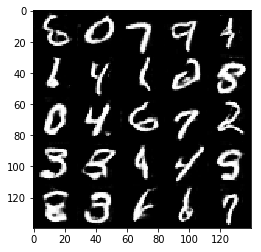

Epoch 2/2... Discriminator Loss: 0.9589... Generator Loss: 1.4420
Epoch 2/2... Discriminator Loss: 0.9059... Generator Loss: 1.1367
Epoch 2/2... Discriminator Loss: 0.9117... Generator Loss: 1.1497
Epoch 2/2... Discriminator Loss: 0.9242... Generator Loss: 0.9690
Epoch 2/2... Discriminator Loss: 1.1693... Generator Loss: 0.7076
Epoch 2/2... Discriminator Loss: 1.4479... Generator Loss: 0.6360
Epoch 2/2... Discriminator Loss: 0.8380... Generator Loss: 1.3415
Epoch 2/2... Discriminator Loss: 0.9824... Generator Loss: 0.7734
Epoch 2/2... Discriminator Loss: 0.9598... Generator Loss: 1.5772
Epoch 2/2... Discriminator Loss: 1.1967... Generator Loss: 0.5316


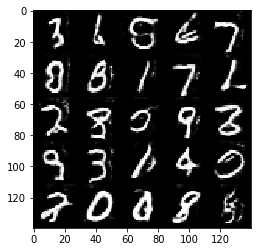

Epoch 2/2... Discriminator Loss: 0.8523... Generator Loss: 1.5162
Epoch 2/2... Discriminator Loss: 1.0840... Generator Loss: 0.9460
Epoch 2/2... Discriminator Loss: 1.0508... Generator Loss: 1.0672
Epoch 2/2... Discriminator Loss: 1.2739... Generator Loss: 1.0747
Epoch 2/2... Discriminator Loss: 0.8854... Generator Loss: 1.0847
Epoch 2/2... Discriminator Loss: 0.9072... Generator Loss: 1.0539
Epoch 2/2... Discriminator Loss: 1.1410... Generator Loss: 0.9235
Epoch 2/2... Discriminator Loss: 1.1206... Generator Loss: 0.5714
Epoch 2/2... Discriminator Loss: 1.0450... Generator Loss: 1.3629
Epoch 2/2... Discriminator Loss: 0.8895... Generator Loss: 1.1207


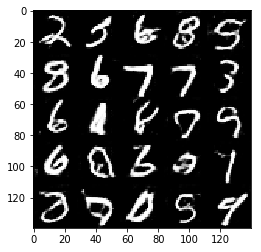

Epoch 2/2... Discriminator Loss: 1.0721... Generator Loss: 0.8588
Epoch 2/2... Discriminator Loss: 1.0636... Generator Loss: 1.3590
Epoch 2/2... Discriminator Loss: 1.1034... Generator Loss: 1.5705
Epoch 2/2... Discriminator Loss: 0.6485... Generator Loss: 1.5914
Epoch 2/2... Discriminator Loss: 1.0616... Generator Loss: 1.6242
Epoch 2/2... Discriminator Loss: 1.0337... Generator Loss: 0.8893
Epoch 2/2... Discriminator Loss: 0.9035... Generator Loss: 1.7954
Epoch 2/2... Discriminator Loss: 1.2793... Generator Loss: 1.0351
Epoch 2/2... Discriminator Loss: 1.1242... Generator Loss: 1.2772
Epoch 2/2... Discriminator Loss: 1.0946... Generator Loss: 0.7523


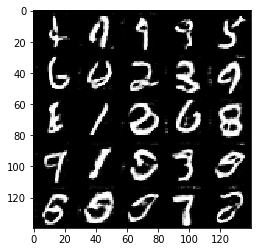

Epoch 2/2... Discriminator Loss: 1.1697... Generator Loss: 0.8605
Epoch 2/2... Discriminator Loss: 0.8806... Generator Loss: 1.5169
Epoch 2/2... Discriminator Loss: 1.2075... Generator Loss: 0.6898
Epoch 2/2... Discriminator Loss: 1.0404... Generator Loss: 1.0110
Epoch 2/2... Discriminator Loss: 1.0034... Generator Loss: 2.0022
Epoch 2/2... Discriminator Loss: 1.1224... Generator Loss: 1.0593
Epoch 2/2... Discriminator Loss: 1.1989... Generator Loss: 1.1492
Epoch 2/2... Discriminator Loss: 0.9952... Generator Loss: 0.9497
Epoch 2/2... Discriminator Loss: 1.0955... Generator Loss: 1.0746
Epoch 2/2... Discriminator Loss: 1.1739... Generator Loss: 1.5552


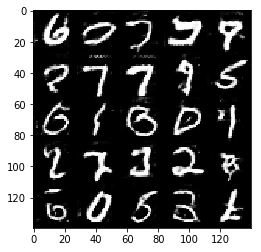

Epoch 2/2... Discriminator Loss: 0.9369... Generator Loss: 0.8443
Epoch 2/2... Discriminator Loss: 1.1347... Generator Loss: 1.6740
Epoch 2/2... Discriminator Loss: 0.8626... Generator Loss: 0.6655
Epoch 2/2... Discriminator Loss: 1.2335... Generator Loss: 0.6134
Epoch 2/2... Discriminator Loss: 1.0875... Generator Loss: 0.9397
Epoch 2/2... Discriminator Loss: 1.1591... Generator Loss: 0.7876
Epoch 2/2... Discriminator Loss: 0.8277... Generator Loss: 1.1329
Epoch 2/2... Discriminator Loss: 0.7782... Generator Loss: 1.1661
Epoch 2/2... Discriminator Loss: 0.9581... Generator Loss: 1.4798
Epoch 2/2... Discriminator Loss: 0.8011... Generator Loss: 1.7238


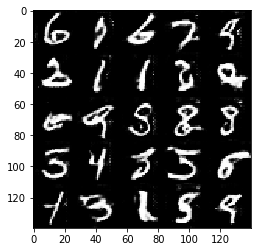

Epoch 2/2... Discriminator Loss: 0.7665... Generator Loss: 1.7094
Epoch 2/2... Discriminator Loss: 0.9788... Generator Loss: 1.0754
Epoch 2/2... Discriminator Loss: 0.8087... Generator Loss: 1.2105
Epoch 2/2... Discriminator Loss: 1.3327... Generator Loss: 1.2367
Epoch 2/2... Discriminator Loss: 1.1307... Generator Loss: 0.6738
Epoch 2/2... Discriminator Loss: 1.2667... Generator Loss: 0.9428
Epoch 2/2... Discriminator Loss: 0.7895... Generator Loss: 1.1071
Epoch 2/2... Discriminator Loss: 1.3198... Generator Loss: 0.9281
Epoch 2/2... Discriminator Loss: 1.2463... Generator Loss: 0.9796
Epoch 2/2... Discriminator Loss: 1.1551... Generator Loss: 1.2357


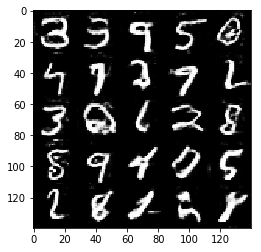

Epoch 2/2... Discriminator Loss: 0.8679... Generator Loss: 1.7921
Epoch 2/2... Discriminator Loss: 1.2662... Generator Loss: 0.7176
Epoch 2/2... Discriminator Loss: 1.1494... Generator Loss: 0.9303
Epoch 2/2... Discriminator Loss: 0.8588... Generator Loss: 1.5312
Epoch 2/2... Discriminator Loss: 1.2898... Generator Loss: 0.6763
Epoch 2/2... Discriminator Loss: 1.0998... Generator Loss: 0.9361
Epoch 2/2... Discriminator Loss: 0.8747... Generator Loss: 1.4551
Epoch 2/2... Discriminator Loss: 1.0912... Generator Loss: 0.5354
Epoch 2/2... Discriminator Loss: 0.7641... Generator Loss: 1.4207
Epoch 2/2... Discriminator Loss: 1.0984... Generator Loss: 0.7682


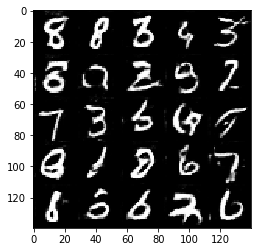

Epoch 2/2... Discriminator Loss: 1.3625... Generator Loss: 1.1691
Epoch 2/2... Discriminator Loss: 1.0373... Generator Loss: 0.7741
Epoch 2/2... Discriminator Loss: 1.7028... Generator Loss: 0.7729
Epoch 2/2... Discriminator Loss: 0.9448... Generator Loss: 1.0467
Epoch 2/2... Discriminator Loss: 0.9371... Generator Loss: 1.3579
Epoch 2/2... Discriminator Loss: 0.9540... Generator Loss: 1.2967
Epoch 2/2... Discriminator Loss: 0.8519... Generator Loss: 1.3204
Epoch 2/2... Discriminator Loss: 1.0950... Generator Loss: 1.3785
Epoch 2/2... Discriminator Loss: 1.1527... Generator Loss: 1.1203
Epoch 2/2... Discriminator Loss: 0.9860... Generator Loss: 2.0867


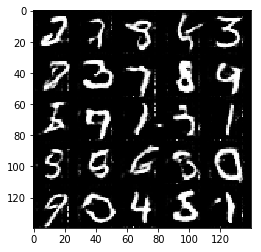

Epoch 2/2... Discriminator Loss: 1.2798... Generator Loss: 0.7460
Epoch 2/2... Discriminator Loss: 1.2949... Generator Loss: 1.5873
Epoch 2/2... Discriminator Loss: 1.2543... Generator Loss: 0.7452
Epoch 2/2... Discriminator Loss: 0.7182... Generator Loss: 1.7155
Epoch 2/2... Discriminator Loss: 1.0581... Generator Loss: 0.6927
Epoch 2/2... Discriminator Loss: 0.9294... Generator Loss: 1.1208
Epoch 2/2... Discriminator Loss: 1.3863... Generator Loss: 1.6946
Epoch 2/2... Discriminator Loss: 0.9325... Generator Loss: 1.4803
Epoch 2/2... Discriminator Loss: 1.3973... Generator Loss: 0.9116
Epoch 2/2... Discriminator Loss: 0.7047... Generator Loss: 1.7759


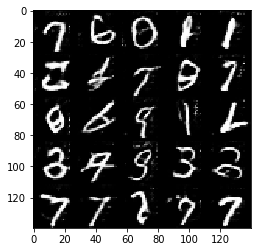

Epoch 2/2... Discriminator Loss: 1.2165... Generator Loss: 1.2550
Epoch 2/2... Discriminator Loss: 1.2779... Generator Loss: 1.2600
Epoch 2/2... Discriminator Loss: 0.8984... Generator Loss: 1.2916
Epoch 2/2... Discriminator Loss: 1.3174... Generator Loss: 0.5231
Epoch 2/2... Discriminator Loss: 1.4004... Generator Loss: 0.5627
Epoch 2/2... Discriminator Loss: 1.0328... Generator Loss: 0.8873
Epoch 2/2... Discriminator Loss: 1.0855... Generator Loss: 1.7420
Epoch 2/2... Discriminator Loss: 1.2436... Generator Loss: 1.0830
Epoch 2/2... Discriminator Loss: 0.9971... Generator Loss: 1.3540
Epoch 2/2... Discriminator Loss: 0.6789... Generator Loss: 1.9099


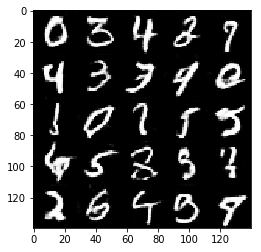

Epoch 2/2... Discriminator Loss: 1.6292... Generator Loss: 1.0088
Epoch 2/2... Discriminator Loss: 0.9056... Generator Loss: 1.2245
Epoch 2/2... Discriminator Loss: 0.9327... Generator Loss: 1.7839
Epoch 2/2... Discriminator Loss: 0.8216... Generator Loss: 1.4875
Epoch 2/2... Discriminator Loss: 1.0935... Generator Loss: 0.9454
Epoch 2/2... Discriminator Loss: 1.5286... Generator Loss: 0.6388
Epoch 2/2... Discriminator Loss: 0.8176... Generator Loss: 1.5874
Epoch 2/2... Discriminator Loss: 1.1629... Generator Loss: 1.2978
Epoch 2/2... Discriminator Loss: 1.4060... Generator Loss: 0.5078
Epoch 2/2... Discriminator Loss: 1.0479... Generator Loss: 1.5292


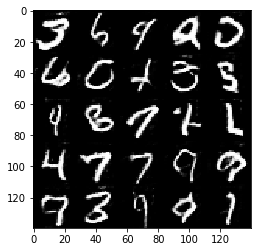

Epoch 2/2... Discriminator Loss: 1.0683... Generator Loss: 0.8319
Epoch 2/2... Discriminator Loss: 1.2197... Generator Loss: 0.9419
Epoch 2/2... Discriminator Loss: 1.0815... Generator Loss: 1.0527
Epoch 2/2... Discriminator Loss: 1.1057... Generator Loss: 1.1721
Epoch 2/2... Discriminator Loss: 0.7932... Generator Loss: 1.6263
Epoch 2/2... Discriminator Loss: 1.0323... Generator Loss: 0.9929
Epoch 2/2... Discriminator Loss: 0.9777... Generator Loss: 1.3402
Epoch 2/2... Discriminator Loss: 1.6484... Generator Loss: 0.6661
Epoch 2/2... Discriminator Loss: 0.8735... Generator Loss: 0.8286
Epoch 2/2... Discriminator Loss: 1.0380... Generator Loss: 0.9488


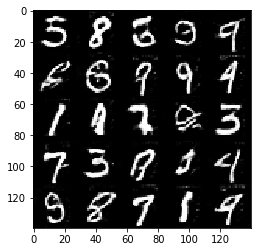

Epoch 2/2... Discriminator Loss: 0.9859... Generator Loss: 0.7449
Epoch 2/2... Discriminator Loss: 1.0482... Generator Loss: 1.0040
Epoch 2/2... Discriminator Loss: 1.9990... Generator Loss: 0.4542
Epoch 2/2... Discriminator Loss: 0.8197... Generator Loss: 1.2857
Epoch 2/2... Discriminator Loss: 1.2139... Generator Loss: 0.6919
Epoch 2/2... Discriminator Loss: 1.1295... Generator Loss: 0.7482
Epoch 2/2... Discriminator Loss: 1.2189... Generator Loss: 0.6908
Epoch 2/2... Discriminator Loss: 1.2036... Generator Loss: 0.8430
Epoch 2/2... Discriminator Loss: 1.0060... Generator Loss: 1.2949
Epoch 2/2... Discriminator Loss: 1.2626... Generator Loss: 1.3342


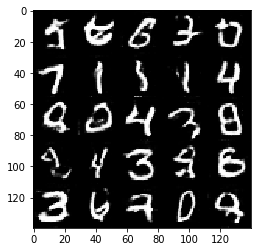

Epoch 2/2... Discriminator Loss: 1.1943... Generator Loss: 1.2642
Epoch 2/2... Discriminator Loss: 1.6037... Generator Loss: 1.3748
Epoch 2/2... Discriminator Loss: 1.1706... Generator Loss: 0.9074
Epoch 2/2... Discriminator Loss: 1.4186... Generator Loss: 0.9453
Epoch 2/2... Discriminator Loss: 0.8282... Generator Loss: 1.4412
Epoch 2/2... Discriminator Loss: 1.2166... Generator Loss: 0.9722
Epoch 2/2... Discriminator Loss: 1.2332... Generator Loss: 0.6682
Epoch 2/2... Discriminator Loss: 1.2865... Generator Loss: 1.0983
Epoch 2/2... Discriminator Loss: 0.9949... Generator Loss: 1.2010
Epoch 2/2... Discriminator Loss: 0.9613... Generator Loss: 1.3262


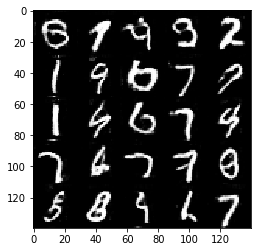

Epoch 2/2... Discriminator Loss: 1.1254... Generator Loss: 0.7106
Epoch 2/2... Discriminator Loss: 1.2377... Generator Loss: 1.5321
Epoch 2/2... Discriminator Loss: 1.2824... Generator Loss: 0.7741
Epoch 2/2... Discriminator Loss: 0.7817... Generator Loss: 1.2421
Epoch 2/2... Discriminator Loss: 0.9572... Generator Loss: 1.3181
Epoch 2/2... Discriminator Loss: 0.8844... Generator Loss: 1.1458
Epoch 2/2... Discriminator Loss: 0.8589... Generator Loss: 1.8375
Epoch 2/2... Discriminator Loss: 0.8705... Generator Loss: 1.1451
Epoch 2/2... Discriminator Loss: 1.1621... Generator Loss: 1.0492
Epoch 2/2... Discriminator Loss: 0.9156... Generator Loss: 1.3692


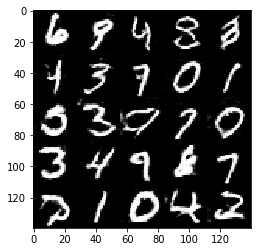

Epoch 2/2... Discriminator Loss: 0.9322... Generator Loss: 2.0969
Epoch 2/2... Discriminator Loss: 0.8228... Generator Loss: 1.7938
Epoch 2/2... Discriminator Loss: 1.3121... Generator Loss: 0.9401
Epoch 2/2... Discriminator Loss: 0.9615... Generator Loss: 1.7686
Epoch 2/2... Discriminator Loss: 1.1230... Generator Loss: 1.4226
Epoch 2/2... Discriminator Loss: 0.8801... Generator Loss: 1.1370
Epoch 2/2... Discriminator Loss: 1.0508... Generator Loss: 1.4185
Epoch 2/2... Discriminator Loss: 0.8261... Generator Loss: 1.9610
Epoch 2/2... Discriminator Loss: 0.9673... Generator Loss: 1.0600
Epoch 2/2... Discriminator Loss: 0.9991... Generator Loss: 0.7933


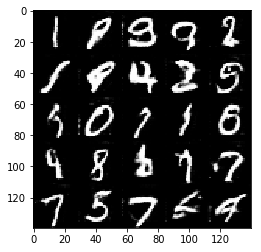

Epoch 2/2... Discriminator Loss: 0.6731... Generator Loss: 1.6512
Epoch 2/2... Discriminator Loss: 1.2286... Generator Loss: 0.6299
Epoch 2/2... Discriminator Loss: 0.9864... Generator Loss: 1.0404
Epoch 2/2... Discriminator Loss: 1.0589... Generator Loss: 0.7642
Epoch 2/2... Discriminator Loss: 1.1253... Generator Loss: 1.3495
Epoch 2/2... Discriminator Loss: 1.1835... Generator Loss: 1.2769
Epoch 2/2... Discriminator Loss: 1.4600... Generator Loss: 0.9339
Epoch 2/2... Discriminator Loss: 0.9528... Generator Loss: 1.5512
Epoch 2/2... Discriminator Loss: 1.0664... Generator Loss: 0.7469
Epoch 2/2... Discriminator Loss: 1.0789... Generator Loss: 1.3807


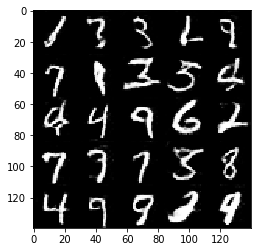

Epoch 2/2... Discriminator Loss: 1.2114... Generator Loss: 1.1106
Epoch 2/2... Discriminator Loss: 1.3604... Generator Loss: 0.7152
Epoch 2/2... Discriminator Loss: 0.8752... Generator Loss: 1.5657
Epoch 2/2... Discriminator Loss: 1.1835... Generator Loss: 0.9824
Epoch 2/2... Discriminator Loss: 1.1069... Generator Loss: 0.5341
Epoch 2/2... Discriminator Loss: 0.8779... Generator Loss: 1.4701
Epoch 2/2... Discriminator Loss: 1.4907... Generator Loss: 0.5966
Epoch 2/2... Discriminator Loss: 0.8636... Generator Loss: 1.2706
Epoch 2/2... Discriminator Loss: 1.0115... Generator Loss: 0.7910
Epoch 2/2... Discriminator Loss: 0.7745... Generator Loss: 2.2782


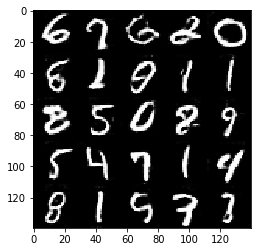

Epoch 2/2... Discriminator Loss: 1.2327... Generator Loss: 1.4461
Epoch 2/2... Discriminator Loss: 1.0741... Generator Loss: 1.3744
Epoch 2/2... Discriminator Loss: 1.3797... Generator Loss: 0.8261
Epoch 2/2... Discriminator Loss: 1.2236... Generator Loss: 1.6811
Epoch 2/2... Discriminator Loss: 1.1575... Generator Loss: 0.7048
Epoch 2/2... Discriminator Loss: 1.1265... Generator Loss: 0.6381
Epoch 2/2... Discriminator Loss: 0.8182... Generator Loss: 0.8133
Epoch 2/2... Discriminator Loss: 1.2781... Generator Loss: 1.4578
Epoch 2/2... Discriminator Loss: 1.0203... Generator Loss: 1.4552
Epoch 2/2... Discriminator Loss: 1.8133... Generator Loss: 0.4580


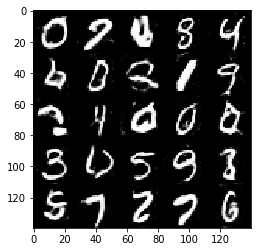

Epoch 2/2... Discriminator Loss: 0.8116... Generator Loss: 1.6642
Epoch 2/2... Discriminator Loss: 1.2102... Generator Loss: 1.1553
Epoch 2/2... Discriminator Loss: 1.1542... Generator Loss: 1.5149
Epoch 2/2... Discriminator Loss: 0.8485... Generator Loss: 1.6651
Epoch 2/2... Discriminator Loss: 1.0584... Generator Loss: 1.5852
Epoch 2/2... Discriminator Loss: 1.0900... Generator Loss: 0.8712
Epoch 2/2... Discriminator Loss: 0.8498... Generator Loss: 1.5524
Epoch 2/2... Discriminator Loss: 0.7220... Generator Loss: 1.4170
Epoch 2/2... Discriminator Loss: 1.0539... Generator Loss: 1.1901
Epoch 2/2... Discriminator Loss: 0.6946... Generator Loss: 2.0496


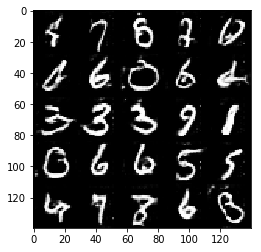

In [23]:

batch_size = 32
z_dim = 100
learning_rate = 0.0004
beta1 = 0.3

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.0309... Generator Loss: 1.2357
Epoch 1/1... Discriminator Loss: 0.4817... Generator Loss: 4.4550
Epoch 1/1... Discriminator Loss: 0.6239... Generator Loss: 3.7893
Epoch 1/1... Discriminator Loss: 0.4267... Generator Loss: 3.4032
Epoch 1/1... Discriminator Loss: 2.0374... Generator Loss: 0.5800
Epoch 1/1... Discriminator Loss: 1.0166... Generator Loss: 1.5383
Epoch 1/1... Discriminator Loss: 2.1956... Generator Loss: 3.3846
Epoch 1/1... Discriminator Loss: 0.8684... Generator Loss: 2.1170
Epoch 1/1... Discriminator Loss: 1.0766... Generator Loss: 3.1832
Epoch 1/1... Discriminator Loss: 2.9802... Generator Loss: 0.1324


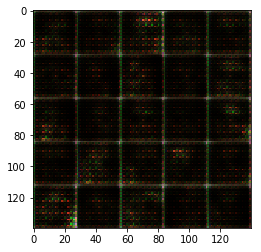

Epoch 1/1... Discriminator Loss: 1.6087... Generator Loss: 0.5523
Epoch 1/1... Discriminator Loss: 0.8800... Generator Loss: 1.2793
Epoch 1/1... Discriminator Loss: 0.4769... Generator Loss: 2.7674
Epoch 1/1... Discriminator Loss: 0.6420... Generator Loss: 2.0851
Epoch 1/1... Discriminator Loss: 0.3978... Generator Loss: 4.1378
Epoch 1/1... Discriminator Loss: 0.4530... Generator Loss: 4.7293
Epoch 1/1... Discriminator Loss: 1.4653... Generator Loss: 4.2738
Epoch 1/1... Discriminator Loss: 1.2580... Generator Loss: 1.0132
Epoch 1/1... Discriminator Loss: 1.1740... Generator Loss: 2.0611
Epoch 1/1... Discriminator Loss: 1.3474... Generator Loss: 0.6001


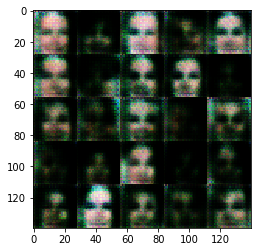

Epoch 1/1... Discriminator Loss: 1.3041... Generator Loss: 0.5962
Epoch 1/1... Discriminator Loss: 2.7464... Generator Loss: 0.2512
Epoch 1/1... Discriminator Loss: 1.3222... Generator Loss: 0.7954
Epoch 1/1... Discriminator Loss: 1.6703... Generator Loss: 2.0573
Epoch 1/1... Discriminator Loss: 0.6619... Generator Loss: 2.1871
Epoch 1/1... Discriminator Loss: 1.3420... Generator Loss: 0.9200
Epoch 1/1... Discriminator Loss: 1.2369... Generator Loss: 1.2520
Epoch 1/1... Discriminator Loss: 0.9813... Generator Loss: 1.4064
Epoch 1/1... Discriminator Loss: 2.1114... Generator Loss: 0.2351
Epoch 1/1... Discriminator Loss: 1.1928... Generator Loss: 1.0989


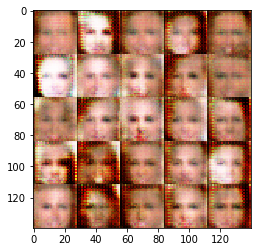

Epoch 1/1... Discriminator Loss: 1.3017... Generator Loss: 0.6398
Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 1.3918
Epoch 1/1... Discriminator Loss: 1.0254... Generator Loss: 1.3114
Epoch 1/1... Discriminator Loss: 1.6518... Generator Loss: 0.4472
Epoch 1/1... Discriminator Loss: 1.5363... Generator Loss: 1.5675
Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 0.7315
Epoch 1/1... Discriminator Loss: 1.0595... Generator Loss: 0.9231
Epoch 1/1... Discriminator Loss: 1.4055... Generator Loss: 0.5303
Epoch 1/1... Discriminator Loss: 2.1942... Generator Loss: 2.4223
Epoch 1/1... Discriminator Loss: 1.6178... Generator Loss: 0.4769


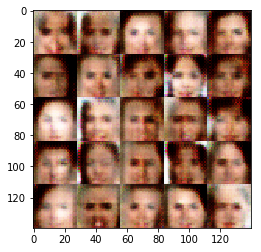

Epoch 1/1... Discriminator Loss: 0.5743... Generator Loss: 2.3055
Epoch 1/1... Discriminator Loss: 1.2508... Generator Loss: 0.6719
Epoch 1/1... Discriminator Loss: 1.3425... Generator Loss: 0.5839
Epoch 1/1... Discriminator Loss: 1.3935... Generator Loss: 1.8693
Epoch 1/1... Discriminator Loss: 1.1536... Generator Loss: 1.1347
Epoch 1/1... Discriminator Loss: 1.5891... Generator Loss: 2.1435
Epoch 1/1... Discriminator Loss: 1.5859... Generator Loss: 0.5733
Epoch 1/1... Discriminator Loss: 0.5836... Generator Loss: 1.6898
Epoch 1/1... Discriminator Loss: 1.4134... Generator Loss: 1.1796
Epoch 1/1... Discriminator Loss: 1.2544... Generator Loss: 1.5420


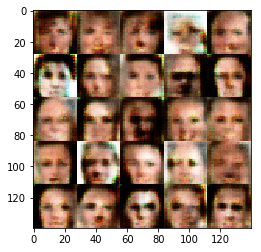

Epoch 1/1... Discriminator Loss: 1.1949... Generator Loss: 1.0632
Epoch 1/1... Discriminator Loss: 0.8079... Generator Loss: 1.9757
Epoch 1/1... Discriminator Loss: 1.0245... Generator Loss: 1.2091
Epoch 1/1... Discriminator Loss: 0.9148... Generator Loss: 1.6123
Epoch 1/1... Discriminator Loss: 1.6605... Generator Loss: 0.4843
Epoch 1/1... Discriminator Loss: 1.3162... Generator Loss: 1.0547
Epoch 1/1... Discriminator Loss: 1.1371... Generator Loss: 0.9062
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.9097
Epoch 1/1... Discriminator Loss: 1.0497... Generator Loss: 0.9390
Epoch 1/1... Discriminator Loss: 1.2173... Generator Loss: 0.7843


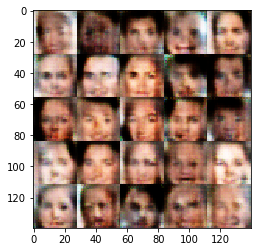

Epoch 1/1... Discriminator Loss: 1.4225... Generator Loss: 0.4373
Epoch 1/1... Discriminator Loss: 0.9819... Generator Loss: 1.0493
Epoch 1/1... Discriminator Loss: 0.6106... Generator Loss: 2.5204
Epoch 1/1... Discriminator Loss: 1.5062... Generator Loss: 0.6152
Epoch 1/1... Discriminator Loss: 1.4468... Generator Loss: 0.7423
Epoch 1/1... Discriminator Loss: 1.0546... Generator Loss: 1.2648
Epoch 1/1... Discriminator Loss: 0.9399... Generator Loss: 0.7611
Epoch 1/1... Discriminator Loss: 1.6116... Generator Loss: 0.5393
Epoch 1/1... Discriminator Loss: 1.4691... Generator Loss: 0.4431
Epoch 1/1... Discriminator Loss: 1.1451... Generator Loss: 0.7307


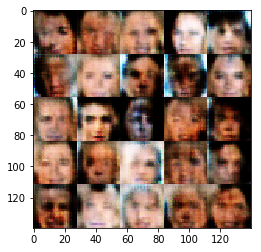

Epoch 1/1... Discriminator Loss: 1.4072... Generator Loss: 0.6614
Epoch 1/1... Discriminator Loss: 1.7766... Generator Loss: 0.6614
Epoch 1/1... Discriminator Loss: 0.8180... Generator Loss: 1.6924
Epoch 1/1... Discriminator Loss: 0.9124... Generator Loss: 2.1586
Epoch 1/1... Discriminator Loss: 1.1109... Generator Loss: 1.1271
Epoch 1/1... Discriminator Loss: 1.3920... Generator Loss: 0.5985
Epoch 1/1... Discriminator Loss: 1.0279... Generator Loss: 1.4462
Epoch 1/1... Discriminator Loss: 1.5556... Generator Loss: 1.5686
Epoch 1/1... Discriminator Loss: 0.9856... Generator Loss: 1.6763
Epoch 1/1... Discriminator Loss: 1.3646... Generator Loss: 0.8427


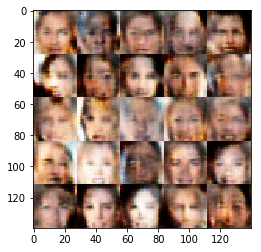

Epoch 1/1... Discriminator Loss: 0.9717... Generator Loss: 1.7332
Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 1.2757
Epoch 1/1... Discriminator Loss: 1.4476... Generator Loss: 0.7261
Epoch 1/1... Discriminator Loss: 1.6035... Generator Loss: 0.7268
Epoch 1/1... Discriminator Loss: 0.9001... Generator Loss: 0.9792
Epoch 1/1... Discriminator Loss: 1.6109... Generator Loss: 0.7430
Epoch 1/1... Discriminator Loss: 1.1907... Generator Loss: 0.7297
Epoch 1/1... Discriminator Loss: 1.2614... Generator Loss: 0.6664
Epoch 1/1... Discriminator Loss: 1.3829... Generator Loss: 1.1844
Epoch 1/1... Discriminator Loss: 1.3982... Generator Loss: 1.3250


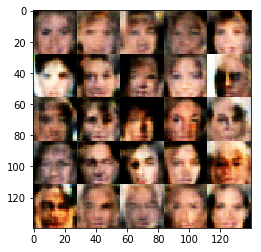

Epoch 1/1... Discriminator Loss: 1.4551... Generator Loss: 0.7782
Epoch 1/1... Discriminator Loss: 1.5186... Generator Loss: 0.6155
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.7807
Epoch 1/1... Discriminator Loss: 1.3641... Generator Loss: 0.7641
Epoch 1/1... Discriminator Loss: 1.0944... Generator Loss: 1.0809
Epoch 1/1... Discriminator Loss: 1.2553... Generator Loss: 0.7600
Epoch 1/1... Discriminator Loss: 1.1271... Generator Loss: 1.8655
Epoch 1/1... Discriminator Loss: 1.3962... Generator Loss: 0.6488
Epoch 1/1... Discriminator Loss: 1.1356... Generator Loss: 1.1502
Epoch 1/1... Discriminator Loss: 1.3113... Generator Loss: 0.8820


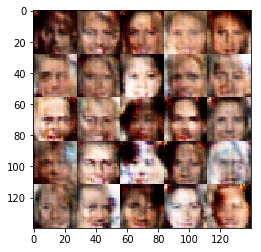

Epoch 1/1... Discriminator Loss: 1.3987... Generator Loss: 1.4974
Epoch 1/1... Discriminator Loss: 1.2827... Generator Loss: 0.7576
Epoch 1/1... Discriminator Loss: 1.1301... Generator Loss: 0.8803
Epoch 1/1... Discriminator Loss: 1.1658... Generator Loss: 1.1985
Epoch 1/1... Discriminator Loss: 1.5477... Generator Loss: 0.4616
Epoch 1/1... Discriminator Loss: 1.2623... Generator Loss: 0.7900
Epoch 1/1... Discriminator Loss: 1.6415... Generator Loss: 0.3644
Epoch 1/1... Discriminator Loss: 1.7177... Generator Loss: 0.6871
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.7727
Epoch 1/1... Discriminator Loss: 1.3009... Generator Loss: 0.9946


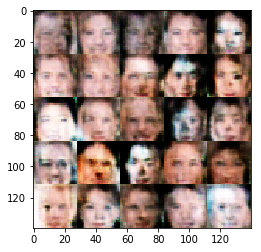

Epoch 1/1... Discriminator Loss: 1.3110... Generator Loss: 0.7529
Epoch 1/1... Discriminator Loss: 1.8258... Generator Loss: 0.2994
Epoch 1/1... Discriminator Loss: 1.3462... Generator Loss: 0.9698
Epoch 1/1... Discriminator Loss: 1.1008... Generator Loss: 1.6382
Epoch 1/1... Discriminator Loss: 1.2534... Generator Loss: 0.4967
Epoch 1/1... Discriminator Loss: 0.9415... Generator Loss: 1.3314
Epoch 1/1... Discriminator Loss: 1.4262... Generator Loss: 0.8635
Epoch 1/1... Discriminator Loss: 1.2270... Generator Loss: 1.1337
Epoch 1/1... Discriminator Loss: 1.0954... Generator Loss: 1.0916
Epoch 1/1... Discriminator Loss: 1.1408... Generator Loss: 0.9613


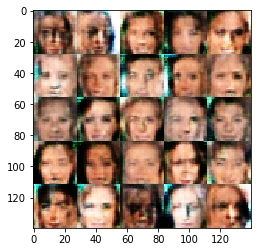

Epoch 1/1... Discriminator Loss: 1.5045... Generator Loss: 0.6488
Epoch 1/1... Discriminator Loss: 2.3567... Generator Loss: 2.2400
Epoch 1/1... Discriminator Loss: 1.4362... Generator Loss: 0.7535
Epoch 1/1... Discriminator Loss: 1.1868... Generator Loss: 1.4424
Epoch 1/1... Discriminator Loss: 1.2458... Generator Loss: 1.2943
Epoch 1/1... Discriminator Loss: 1.0137... Generator Loss: 1.5653
Epoch 1/1... Discriminator Loss: 1.4241... Generator Loss: 0.7204
Epoch 1/1... Discriminator Loss: 1.2969... Generator Loss: 0.6116
Epoch 1/1... Discriminator Loss: 1.3518... Generator Loss: 0.7278
Epoch 1/1... Discriminator Loss: 1.0963... Generator Loss: 0.9778


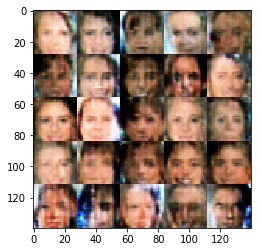

Epoch 1/1... Discriminator Loss: 1.1860... Generator Loss: 1.2683
Epoch 1/1... Discriminator Loss: 1.4442... Generator Loss: 0.8869
Epoch 1/1... Discriminator Loss: 0.9056... Generator Loss: 1.0015
Epoch 1/1... Discriminator Loss: 1.1543... Generator Loss: 0.9373
Epoch 1/1... Discriminator Loss: 1.7294... Generator Loss: 1.3509
Epoch 1/1... Discriminator Loss: 1.2750... Generator Loss: 0.6636
Epoch 1/1... Discriminator Loss: 1.5085... Generator Loss: 1.6677
Epoch 1/1... Discriminator Loss: 1.0693... Generator Loss: 1.2490
Epoch 1/1... Discriminator Loss: 1.2584... Generator Loss: 0.6546
Epoch 1/1... Discriminator Loss: 1.1751... Generator Loss: 0.8054


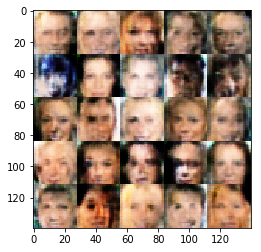

Epoch 1/1... Discriminator Loss: 1.7548... Generator Loss: 0.8083
Epoch 1/1... Discriminator Loss: 0.9836... Generator Loss: 0.8570
Epoch 1/1... Discriminator Loss: 1.2341... Generator Loss: 0.8569
Epoch 1/1... Discriminator Loss: 0.9861... Generator Loss: 1.2293
Epoch 1/1... Discriminator Loss: 1.1391... Generator Loss: 0.8010
Epoch 1/1... Discriminator Loss: 1.0658... Generator Loss: 1.8601
Epoch 1/1... Discriminator Loss: 1.2827... Generator Loss: 0.7689
Epoch 1/1... Discriminator Loss: 1.1256... Generator Loss: 0.9976
Epoch 1/1... Discriminator Loss: 1.5503... Generator Loss: 0.3796
Epoch 1/1... Discriminator Loss: 1.1320... Generator Loss: 0.6591


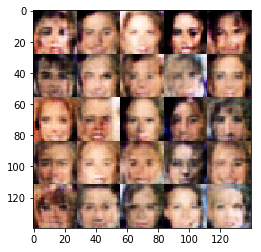

Epoch 1/1... Discriminator Loss: 0.7999... Generator Loss: 1.4877
Epoch 1/1... Discriminator Loss: 1.0968... Generator Loss: 0.9631
Epoch 1/1... Discriminator Loss: 0.7446... Generator Loss: 1.9922
Epoch 1/1... Discriminator Loss: 1.5644... Generator Loss: 0.5347
Epoch 1/1... Discriminator Loss: 1.1483... Generator Loss: 1.1498
Epoch 1/1... Discriminator Loss: 1.3248... Generator Loss: 1.0795
Epoch 1/1... Discriminator Loss: 1.6857... Generator Loss: 2.4205
Epoch 1/1... Discriminator Loss: 1.3463... Generator Loss: 2.0183
Epoch 1/1... Discriminator Loss: 1.3182... Generator Loss: 0.8352
Epoch 1/1... Discriminator Loss: 1.1073... Generator Loss: 2.0030


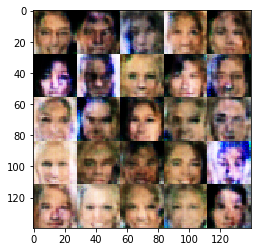

Epoch 1/1... Discriminator Loss: 1.2870... Generator Loss: 0.6900
Epoch 1/1... Discriminator Loss: 1.2095... Generator Loss: 1.0844
Epoch 1/1... Discriminator Loss: 1.4242... Generator Loss: 1.6868
Epoch 1/1... Discriminator Loss: 1.4688... Generator Loss: 0.5729
Epoch 1/1... Discriminator Loss: 1.5696... Generator Loss: 0.5111
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.8623
Epoch 1/1... Discriminator Loss: 1.3410... Generator Loss: 1.0149
Epoch 1/1... Discriminator Loss: 1.3590... Generator Loss: 0.5501
Epoch 1/1... Discriminator Loss: 2.0769... Generator Loss: 1.9497
Epoch 1/1... Discriminator Loss: 1.5886... Generator Loss: 0.5718


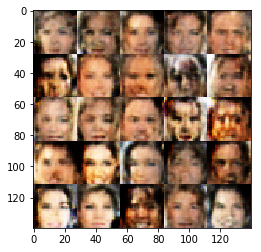

Epoch 1/1... Discriminator Loss: 1.8039... Generator Loss: 1.3958
Epoch 1/1... Discriminator Loss: 1.1997... Generator Loss: 0.8877
Epoch 1/1... Discriminator Loss: 1.7815... Generator Loss: 0.9903
Epoch 1/1... Discriminator Loss: 1.1399... Generator Loss: 1.7147
Epoch 1/1... Discriminator Loss: 1.1210... Generator Loss: 1.7763
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 1.8427
Epoch 1/1... Discriminator Loss: 1.0793... Generator Loss: 0.9634
Epoch 1/1... Discriminator Loss: 1.7116... Generator Loss: 0.6454
Epoch 1/1... Discriminator Loss: 1.3698... Generator Loss: 1.0697
Epoch 1/1... Discriminator Loss: 1.4705... Generator Loss: 0.4449


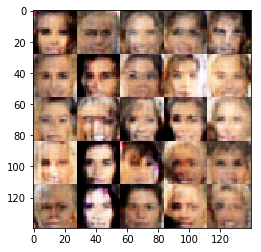

Epoch 1/1... Discriminator Loss: 1.1880... Generator Loss: 1.2945
Epoch 1/1... Discriminator Loss: 0.9885... Generator Loss: 1.9134
Epoch 1/1... Discriminator Loss: 1.5599... Generator Loss: 0.5101
Epoch 1/1... Discriminator Loss: 1.0657... Generator Loss: 1.3074
Epoch 1/1... Discriminator Loss: 1.1417... Generator Loss: 1.7784
Epoch 1/1... Discriminator Loss: 1.4152... Generator Loss: 1.4528
Epoch 1/1... Discriminator Loss: 1.3782... Generator Loss: 0.4883
Epoch 1/1... Discriminator Loss: 1.3525... Generator Loss: 0.8651
Epoch 1/1... Discriminator Loss: 1.2848... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.1054... Generator Loss: 1.0830


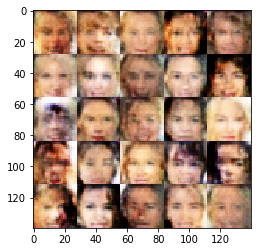

Epoch 1/1... Discriminator Loss: 1.2644... Generator Loss: 0.6764
Epoch 1/1... Discriminator Loss: 1.2914... Generator Loss: 0.6129
Epoch 1/1... Discriminator Loss: 1.9980... Generator Loss: 2.1961
Epoch 1/1... Discriminator Loss: 1.2073... Generator Loss: 1.1083
Epoch 1/1... Discriminator Loss: 1.5411... Generator Loss: 0.9483
Epoch 1/1... Discriminator Loss: 0.9704... Generator Loss: 0.9268
Epoch 1/1... Discriminator Loss: 1.1805... Generator Loss: 0.6453
Epoch 1/1... Discriminator Loss: 1.7104... Generator Loss: 0.5195
Epoch 1/1... Discriminator Loss: 1.0515... Generator Loss: 1.1007
Epoch 1/1... Discriminator Loss: 1.6018... Generator Loss: 0.4868


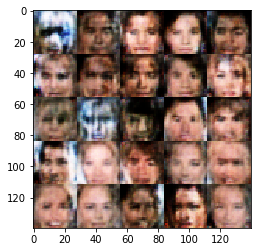

Epoch 1/1... Discriminator Loss: 0.8448... Generator Loss: 1.2739
Epoch 1/1... Discriminator Loss: 1.9437... Generator Loss: 0.2713
Epoch 1/1... Discriminator Loss: 1.0909... Generator Loss: 0.8725
Epoch 1/1... Discriminator Loss: 1.2112... Generator Loss: 1.0325
Epoch 1/1... Discriminator Loss: 1.3501... Generator Loss: 0.6974
Epoch 1/1... Discriminator Loss: 1.4791... Generator Loss: 1.2658
Epoch 1/1... Discriminator Loss: 0.9838... Generator Loss: 1.6142
Epoch 1/1... Discriminator Loss: 1.2532... Generator Loss: 0.9452
Epoch 1/1... Discriminator Loss: 1.2986... Generator Loss: 1.1622
Epoch 1/1... Discriminator Loss: 1.4781... Generator Loss: 0.4846


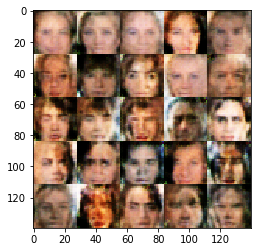

Epoch 1/1... Discriminator Loss: 1.3501... Generator Loss: 0.5484
Epoch 1/1... Discriminator Loss: 1.1554... Generator Loss: 0.9122
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.4524
Epoch 1/1... Discriminator Loss: 0.7564... Generator Loss: 1.4781
Epoch 1/1... Discriminator Loss: 1.1241... Generator Loss: 1.4696
Epoch 1/1... Discriminator Loss: 0.9783... Generator Loss: 1.0903
Epoch 1/1... Discriminator Loss: 1.4959... Generator Loss: 0.6190
Epoch 1/1... Discriminator Loss: 1.1040... Generator Loss: 0.9590
Epoch 1/1... Discriminator Loss: 1.0449... Generator Loss: 1.4630
Epoch 1/1... Discriminator Loss: 1.6205... Generator Loss: 1.5454


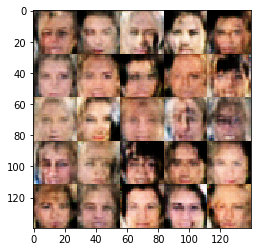

Epoch 1/1... Discriminator Loss: 1.4429... Generator Loss: 1.2308
Epoch 1/1... Discriminator Loss: 1.1170... Generator Loss: 0.7610
Epoch 1/1... Discriminator Loss: 1.2381... Generator Loss: 1.0381
Epoch 1/1... Discriminator Loss: 1.4225... Generator Loss: 1.1071
Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 0.8745
Epoch 1/1... Discriminator Loss: 0.9679... Generator Loss: 1.2542
Epoch 1/1... Discriminator Loss: 1.2419... Generator Loss: 0.7592
Epoch 1/1... Discriminator Loss: 1.0361... Generator Loss: 0.7572
Epoch 1/1... Discriminator Loss: 1.1999... Generator Loss: 0.6432
Epoch 1/1... Discriminator Loss: 1.3186... Generator Loss: 0.8136


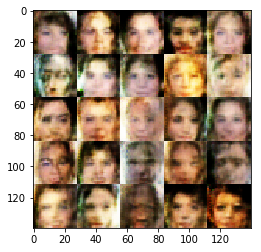

Epoch 1/1... Discriminator Loss: 1.0414... Generator Loss: 1.3646
Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 0.9327
Epoch 1/1... Discriminator Loss: 1.2043... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 1.1574... Generator Loss: 1.3955
Epoch 1/1... Discriminator Loss: 1.1789... Generator Loss: 1.1611
Epoch 1/1... Discriminator Loss: 1.2317... Generator Loss: 0.8520
Epoch 1/1... Discriminator Loss: 1.0575... Generator Loss: 1.0195
Epoch 1/1... Discriminator Loss: 1.4725... Generator Loss: 0.4683
Epoch 1/1... Discriminator Loss: 0.9354... Generator Loss: 1.0703
Epoch 1/1... Discriminator Loss: 0.7105... Generator Loss: 1.3166


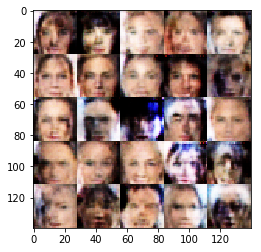

Epoch 1/1... Discriminator Loss: 1.0728... Generator Loss: 1.0783
Epoch 1/1... Discriminator Loss: 0.8670... Generator Loss: 1.5911
Epoch 1/1... Discriminator Loss: 1.2189... Generator Loss: 1.2832
Epoch 1/1... Discriminator Loss: 0.7383... Generator Loss: 1.4081
Epoch 1/1... Discriminator Loss: 1.1018... Generator Loss: 1.0750
Epoch 1/1... Discriminator Loss: 1.1883... Generator Loss: 0.9406
Epoch 1/1... Discriminator Loss: 0.7646... Generator Loss: 1.1994
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 1.5818
Epoch 1/1... Discriminator Loss: 1.2939... Generator Loss: 1.6394
Epoch 1/1... Discriminator Loss: 0.9306... Generator Loss: 1.0417


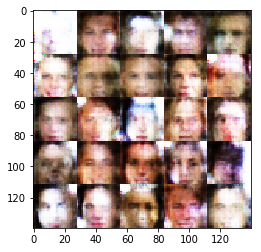

Epoch 1/1... Discriminator Loss: 1.1953... Generator Loss: 0.7626
Epoch 1/1... Discriminator Loss: 0.8597... Generator Loss: 1.2956
Epoch 1/1... Discriminator Loss: 0.9840... Generator Loss: 1.0625
Epoch 1/1... Discriminator Loss: 0.7268... Generator Loss: 1.3895
Epoch 1/1... Discriminator Loss: 0.5328... Generator Loss: 2.1436
Epoch 1/1... Discriminator Loss: 0.7404... Generator Loss: 1.9041
Epoch 1/1... Discriminator Loss: 1.0685... Generator Loss: 1.2253
Epoch 1/1... Discriminator Loss: 0.7773... Generator Loss: 1.3931
Epoch 1/1... Discriminator Loss: 0.7638... Generator Loss: 1.2789
Epoch 1/1... Discriminator Loss: 1.2359... Generator Loss: 1.1972


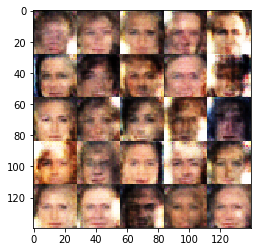

Epoch 1/1... Discriminator Loss: 0.9395... Generator Loss: 1.3155
Epoch 1/1... Discriminator Loss: 0.9618... Generator Loss: 0.8663
Epoch 1/1... Discriminator Loss: 1.4966... Generator Loss: 0.4682
Epoch 1/1... Discriminator Loss: 1.5386... Generator Loss: 0.4240
Epoch 1/1... Discriminator Loss: 1.2107... Generator Loss: 0.8684
Epoch 1/1... Discriminator Loss: 0.9444... Generator Loss: 1.2597
Epoch 1/1... Discriminator Loss: 1.3386... Generator Loss: 0.8393
Epoch 1/1... Discriminator Loss: 1.3421... Generator Loss: 1.8334
Epoch 1/1... Discriminator Loss: 1.0653... Generator Loss: 1.1670
Epoch 1/1... Discriminator Loss: 1.4459... Generator Loss: 0.7599


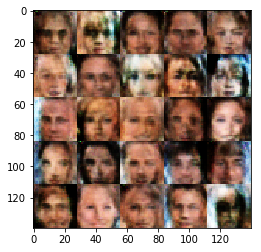

Epoch 1/1... Discriminator Loss: 1.1905... Generator Loss: 1.0790
Epoch 1/1... Discriminator Loss: 1.9643... Generator Loss: 0.2087
Epoch 1/1... Discriminator Loss: 1.4001... Generator Loss: 0.9617
Epoch 1/1... Discriminator Loss: 0.9116... Generator Loss: 1.1408
Epoch 1/1... Discriminator Loss: 1.2563... Generator Loss: 0.9316
Epoch 1/1... Discriminator Loss: 1.5137... Generator Loss: 0.4045
Epoch 1/1... Discriminator Loss: 1.5463... Generator Loss: 0.6604
Epoch 1/1... Discriminator Loss: 1.3988... Generator Loss: 1.2981
Epoch 1/1... Discriminator Loss: 1.5674... Generator Loss: 0.4810
Epoch 1/1... Discriminator Loss: 1.5987... Generator Loss: 0.3350


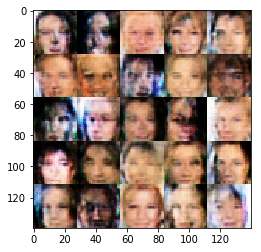

Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 0.7610
Epoch 1/1... Discriminator Loss: 1.0370... Generator Loss: 1.1177
Epoch 1/1... Discriminator Loss: 1.4742... Generator Loss: 0.4480
Epoch 1/1... Discriminator Loss: 0.8315... Generator Loss: 1.1518
Epoch 1/1... Discriminator Loss: 1.1666... Generator Loss: 1.1690
Epoch 1/1... Discriminator Loss: 1.8823... Generator Loss: 1.2908
Epoch 1/1... Discriminator Loss: 1.1058... Generator Loss: 0.8688
Epoch 1/1... Discriminator Loss: 1.0090... Generator Loss: 0.8109
Epoch 1/1... Discriminator Loss: 1.3112... Generator Loss: 1.0300
Epoch 1/1... Discriminator Loss: 1.1640... Generator Loss: 0.9557


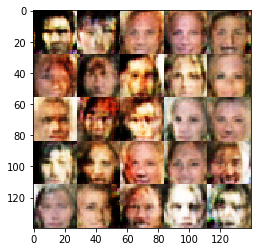

Epoch 1/1... Discriminator Loss: 0.8338... Generator Loss: 1.0811
Epoch 1/1... Discriminator Loss: 1.3141... Generator Loss: 0.9658
Epoch 1/1... Discriminator Loss: 1.3337... Generator Loss: 0.9700
Epoch 1/1... Discriminator Loss: 1.3534... Generator Loss: 1.4867
Epoch 1/1... Discriminator Loss: 1.3153... Generator Loss: 0.5727
Epoch 1/1... Discriminator Loss: 1.3094... Generator Loss: 0.7950
Epoch 1/1... Discriminator Loss: 0.8455... Generator Loss: 1.3684
Epoch 1/1... Discriminator Loss: 1.5280... Generator Loss: 0.6355
Epoch 1/1... Discriminator Loss: 1.0997... Generator Loss: 1.6074
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 1.2207


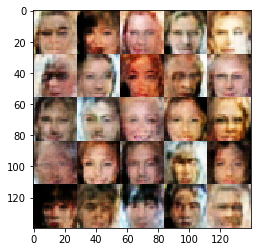

Epoch 1/1... Discriminator Loss: 1.3260... Generator Loss: 0.7944
Epoch 1/1... Discriminator Loss: 1.2245... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.1296... Generator Loss: 1.3047
Epoch 1/1... Discriminator Loss: 0.9780... Generator Loss: 0.8527
Epoch 1/1... Discriminator Loss: 1.3343... Generator Loss: 0.6198
Epoch 1/1... Discriminator Loss: 1.4848... Generator Loss: 0.5116
Epoch 1/1... Discriminator Loss: 1.2074... Generator Loss: 0.8052
Epoch 1/1... Discriminator Loss: 1.2615... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.3756... Generator Loss: 0.7170
Epoch 1/1... Discriminator Loss: 1.6502... Generator Loss: 0.4439


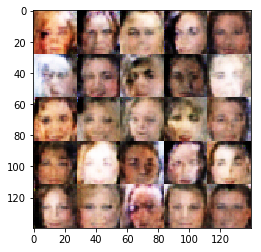

Epoch 1/1... Discriminator Loss: 1.1631... Generator Loss: 0.9875
Epoch 1/1... Discriminator Loss: 1.2878... Generator Loss: 0.8340
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.6533
Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.6214
Epoch 1/1... Discriminator Loss: 1.3986... Generator Loss: 0.5352
Epoch 1/1... Discriminator Loss: 0.9246... Generator Loss: 1.0690
Epoch 1/1... Discriminator Loss: 2.1532... Generator Loss: 2.2916
Epoch 1/1... Discriminator Loss: 1.0513... Generator Loss: 1.1555
Epoch 1/1... Discriminator Loss: 1.2593... Generator Loss: 0.8425
Epoch 1/1... Discriminator Loss: 1.8368... Generator Loss: 0.3163


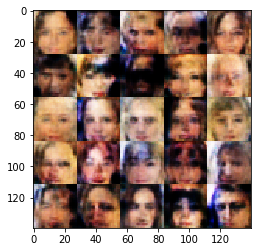

Epoch 1/1... Discriminator Loss: 1.1743... Generator Loss: 0.9656
Epoch 1/1... Discriminator Loss: 1.4252... Generator Loss: 0.4607
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 1.0626... Generator Loss: 1.6025
Epoch 1/1... Discriminator Loss: 1.2234... Generator Loss: 0.7566
Epoch 1/1... Discriminator Loss: 1.5239... Generator Loss: 0.5813
Epoch 1/1... Discriminator Loss: 1.0595... Generator Loss: 0.9816
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.8329
Epoch 1/1... Discriminator Loss: 1.2627... Generator Loss: 0.7397
Epoch 1/1... Discriminator Loss: 1.1555... Generator Loss: 0.7135


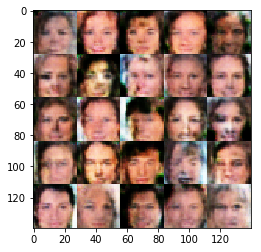

Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.5075
Epoch 1/1... Discriminator Loss: 1.2542... Generator Loss: 1.1015
Epoch 1/1... Discriminator Loss: 1.7309... Generator Loss: 0.3192
Epoch 1/1... Discriminator Loss: 1.2941... Generator Loss: 0.5720
Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.6129
Epoch 1/1... Discriminator Loss: 1.4008... Generator Loss: 0.5410
Epoch 1/1... Discriminator Loss: 1.2783... Generator Loss: 1.0251
Epoch 1/1... Discriminator Loss: 0.8946... Generator Loss: 1.2807
Epoch 1/1... Discriminator Loss: 1.5010... Generator Loss: 0.6697
Epoch 1/1... Discriminator Loss: 0.9414... Generator Loss: 1.0204


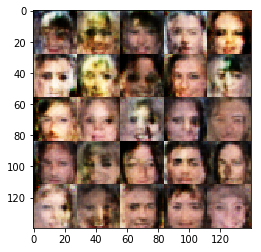

Epoch 1/1... Discriminator Loss: 1.3956... Generator Loss: 1.4840
Epoch 1/1... Discriminator Loss: 1.5354... Generator Loss: 0.5048
Epoch 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.9165
Epoch 1/1... Discriminator Loss: 1.2540... Generator Loss: 0.7975
Epoch 1/1... Discriminator Loss: 1.3037... Generator Loss: 0.4747
Epoch 1/1... Discriminator Loss: 0.8362... Generator Loss: 0.9685
Epoch 1/1... Discriminator Loss: 0.8845... Generator Loss: 1.2090
Epoch 1/1... Discriminator Loss: 1.1899... Generator Loss: 1.1377
Epoch 1/1... Discriminator Loss: 1.5548... Generator Loss: 0.7290
Epoch 1/1... Discriminator Loss: 1.5377... Generator Loss: 0.8955


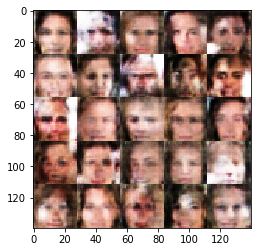

Epoch 1/1... Discriminator Loss: 1.0770... Generator Loss: 1.0442
Epoch 1/1... Discriminator Loss: 2.7600... Generator Loss: 3.0500
Epoch 1/1... Discriminator Loss: 0.7309... Generator Loss: 1.4018
Epoch 1/1... Discriminator Loss: 0.8509... Generator Loss: 1.4785
Epoch 1/1... Discriminator Loss: 0.8962... Generator Loss: 1.1523
Epoch 1/1... Discriminator Loss: 0.8184... Generator Loss: 1.4452
Epoch 1/1... Discriminator Loss: 0.9297... Generator Loss: 0.8271
Epoch 1/1... Discriminator Loss: 0.8245... Generator Loss: 1.7407
Epoch 1/1... Discriminator Loss: 1.0136... Generator Loss: 0.8689
Epoch 1/1... Discriminator Loss: 1.3388... Generator Loss: 1.1766


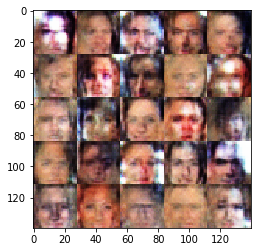

Epoch 1/1... Discriminator Loss: 1.1896... Generator Loss: 0.7662
Epoch 1/1... Discriminator Loss: 0.6574... Generator Loss: 1.4508
Epoch 1/1... Discriminator Loss: 1.4814... Generator Loss: 0.4918
Epoch 1/1... Discriminator Loss: 0.6862... Generator Loss: 1.9791
Epoch 1/1... Discriminator Loss: 1.4951... Generator Loss: 0.5097
Epoch 1/1... Discriminator Loss: 1.3997... Generator Loss: 0.7025
Epoch 1/1... Discriminator Loss: 1.3250... Generator Loss: 0.9531
Epoch 1/1... Discriminator Loss: 1.0795... Generator Loss: 0.9578
Epoch 1/1... Discriminator Loss: 1.5570... Generator Loss: 0.5988
Epoch 1/1... Discriminator Loss: 0.8268... Generator Loss: 2.1137


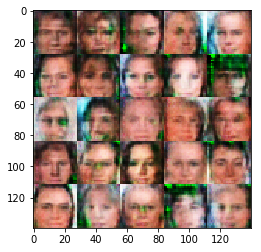

Epoch 1/1... Discriminator Loss: 1.4038... Generator Loss: 1.7530
Epoch 1/1... Discriminator Loss: 1.7715... Generator Loss: 0.4010
Epoch 1/1... Discriminator Loss: 1.0606... Generator Loss: 0.8349
Epoch 1/1... Discriminator Loss: 1.2261... Generator Loss: 1.4616
Epoch 1/1... Discriminator Loss: 1.2203... Generator Loss: 0.9114
Epoch 1/1... Discriminator Loss: 1.7164... Generator Loss: 0.4514
Epoch 1/1... Discriminator Loss: 1.4070... Generator Loss: 1.0583
Epoch 1/1... Discriminator Loss: 1.5365... Generator Loss: 1.0273
Epoch 1/1... Discriminator Loss: 1.4071... Generator Loss: 0.7232
Epoch 1/1... Discriminator Loss: 1.1144... Generator Loss: 1.0475


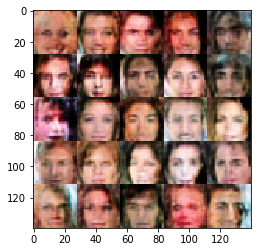

Epoch 1/1... Discriminator Loss: 1.0707... Generator Loss: 1.0839
Epoch 1/1... Discriminator Loss: 1.1385... Generator Loss: 0.9764
Epoch 1/1... Discriminator Loss: 1.3721... Generator Loss: 0.8065
Epoch 1/1... Discriminator Loss: 1.3800... Generator Loss: 0.4697
Epoch 1/1... Discriminator Loss: 1.0787... Generator Loss: 1.2635
Epoch 1/1... Discriminator Loss: 1.0462... Generator Loss: 0.9073
Epoch 1/1... Discriminator Loss: 1.0476... Generator Loss: 1.5808
Epoch 1/1... Discriminator Loss: 1.2238... Generator Loss: 0.6398
Epoch 1/1... Discriminator Loss: 1.5286... Generator Loss: 0.8741
Epoch 1/1... Discriminator Loss: 1.1001... Generator Loss: 1.1005


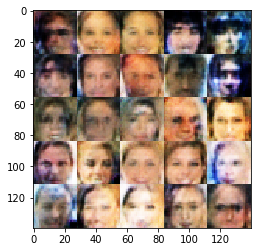

Epoch 1/1... Discriminator Loss: 1.1744... Generator Loss: 1.1475
Epoch 1/1... Discriminator Loss: 1.2353... Generator Loss: 0.7325
Epoch 1/1... Discriminator Loss: 1.0041... Generator Loss: 1.1439
Epoch 1/1... Discriminator Loss: 1.2905... Generator Loss: 0.7874
Epoch 1/1... Discriminator Loss: 1.1658... Generator Loss: 0.8677
Epoch 1/1... Discriminator Loss: 0.9219... Generator Loss: 1.0516
Epoch 1/1... Discriminator Loss: 1.4553... Generator Loss: 0.6247
Epoch 1/1... Discriminator Loss: 1.2738... Generator Loss: 0.7724
Epoch 1/1... Discriminator Loss: 1.4434... Generator Loss: 0.5794
Epoch 1/1... Discriminator Loss: 1.4039... Generator Loss: 0.8037


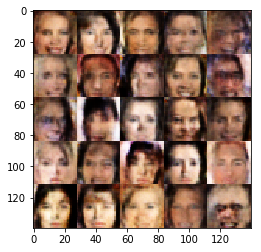

Epoch 1/1... Discriminator Loss: 1.5490... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 1.2791... Generator Loss: 0.9462
Epoch 1/1... Discriminator Loss: 1.3661... Generator Loss: 0.7595
Epoch 1/1... Discriminator Loss: 1.4367... Generator Loss: 0.7969
Epoch 1/1... Discriminator Loss: 1.5763... Generator Loss: 0.8462
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 1.5818
Epoch 1/1... Discriminator Loss: 1.3610... Generator Loss: 0.6501
Epoch 1/1... Discriminator Loss: 1.0385... Generator Loss: 1.2515
Epoch 1/1... Discriminator Loss: 1.2786... Generator Loss: 1.0071
Epoch 1/1... Discriminator Loss: 1.2185... Generator Loss: 0.8935


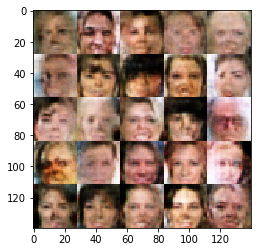

Epoch 1/1... Discriminator Loss: 1.3149... Generator Loss: 2.1650
Epoch 1/1... Discriminator Loss: 1.3965... Generator Loss: 0.8123
Epoch 1/1... Discriminator Loss: 1.4653... Generator Loss: 1.0095
Epoch 1/1... Discriminator Loss: 1.3103... Generator Loss: 0.6657
Epoch 1/1... Discriminator Loss: 1.2030... Generator Loss: 0.7127
Epoch 1/1... Discriminator Loss: 1.2632... Generator Loss: 0.5855
Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 0.8205
Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 1.0468
Epoch 1/1... Discriminator Loss: 1.2590... Generator Loss: 1.0478
Epoch 1/1... Discriminator Loss: 1.0375... Generator Loss: 1.6658


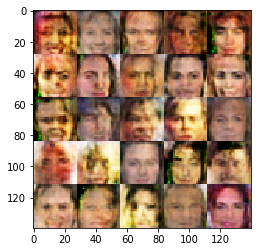

Epoch 1/1... Discriminator Loss: 1.3101... Generator Loss: 1.0751
Epoch 1/1... Discriminator Loss: 1.2018... Generator Loss: 0.8135
Epoch 1/1... Discriminator Loss: 1.2571... Generator Loss: 0.6883
Epoch 1/1... Discriminator Loss: 1.5334... Generator Loss: 0.9440
Epoch 1/1... Discriminator Loss: 1.3521... Generator Loss: 0.7574
Epoch 1/1... Discriminator Loss: 1.3920... Generator Loss: 0.5497
Epoch 1/1... Discriminator Loss: 1.3022... Generator Loss: 0.6616
Epoch 1/1... Discriminator Loss: 1.5021... Generator Loss: 0.8498
Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 1.1253
Epoch 1/1... Discriminator Loss: 1.4587... Generator Loss: 0.6463


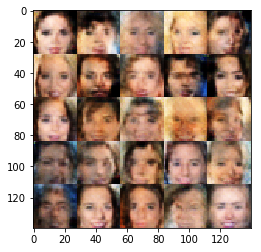

Epoch 1/1... Discriminator Loss: 1.0372... Generator Loss: 0.9850
Epoch 1/1... Discriminator Loss: 1.6138... Generator Loss: 0.6345
Epoch 1/1... Discriminator Loss: 1.2434... Generator Loss: 1.5283
Epoch 1/1... Discriminator Loss: 1.1759... Generator Loss: 0.7785
Epoch 1/1... Discriminator Loss: 1.3502... Generator Loss: 0.9139
Epoch 1/1... Discriminator Loss: 1.4344... Generator Loss: 0.6846
Epoch 1/1... Discriminator Loss: 1.1895... Generator Loss: 1.2022
Epoch 1/1... Discriminator Loss: 1.2085... Generator Loss: 0.9272
Epoch 1/1... Discriminator Loss: 1.2039... Generator Loss: 1.1436
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.7320


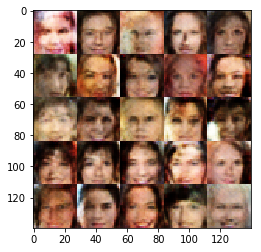

Epoch 1/1... Discriminator Loss: 1.5558... Generator Loss: 0.7945
Epoch 1/1... Discriminator Loss: 1.1432... Generator Loss: 0.9494
Epoch 1/1... Discriminator Loss: 0.9252... Generator Loss: 1.8409
Epoch 1/1... Discriminator Loss: 1.5084... Generator Loss: 0.7595
Epoch 1/1... Discriminator Loss: 1.2524... Generator Loss: 0.6945
Epoch 1/1... Discriminator Loss: 1.1308... Generator Loss: 1.0975
Epoch 1/1... Discriminator Loss: 1.2267... Generator Loss: 0.9142
Epoch 1/1... Discriminator Loss: 1.3324... Generator Loss: 0.6338
Epoch 1/1... Discriminator Loss: 1.8429... Generator Loss: 0.4589
Epoch 1/1... Discriminator Loss: 1.4563... Generator Loss: 0.8252


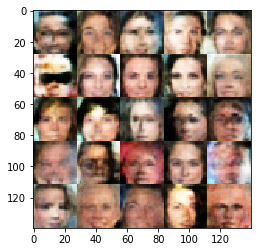

Epoch 1/1... Discriminator Loss: 1.4273... Generator Loss: 0.5908
Epoch 1/1... Discriminator Loss: 1.2742... Generator Loss: 0.5639
Epoch 1/1... Discriminator Loss: 1.3388... Generator Loss: 0.7733
Epoch 1/1... Discriminator Loss: 1.0292... Generator Loss: 1.5101
Epoch 1/1... Discriminator Loss: 1.0959... Generator Loss: 1.1415
Epoch 1/1... Discriminator Loss: 1.6153... Generator Loss: 0.4359
Epoch 1/1... Discriminator Loss: 1.3425... Generator Loss: 0.7760
Epoch 1/1... Discriminator Loss: 0.6334... Generator Loss: 1.6182
Epoch 1/1... Discriminator Loss: 1.2471... Generator Loss: 0.6643
Epoch 1/1... Discriminator Loss: 1.2611... Generator Loss: 0.8315


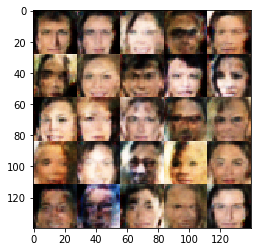

Epoch 1/1... Discriminator Loss: 1.2195... Generator Loss: 0.8175
Epoch 1/1... Discriminator Loss: 1.0087... Generator Loss: 1.0065
Epoch 1/1... Discriminator Loss: 1.2027... Generator Loss: 1.4625
Epoch 1/1... Discriminator Loss: 1.1415... Generator Loss: 1.0293
Epoch 1/1... Discriminator Loss: 1.4631... Generator Loss: 0.5973
Epoch 1/1... Discriminator Loss: 1.1737... Generator Loss: 0.9960
Epoch 1/1... Discriminator Loss: 1.3944... Generator Loss: 0.7070
Epoch 1/1... Discriminator Loss: 1.0697... Generator Loss: 1.1377
Epoch 1/1... Discriminator Loss: 1.0860... Generator Loss: 0.9681
Epoch 1/1... Discriminator Loss: 1.1621... Generator Loss: 1.0392


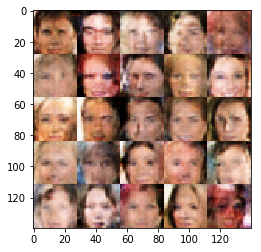

Epoch 1/1... Discriminator Loss: 1.0273... Generator Loss: 1.0569
Epoch 1/1... Discriminator Loss: 1.6280... Generator Loss: 0.6776
Epoch 1/1... Discriminator Loss: 1.4437... Generator Loss: 0.7060
Epoch 1/1... Discriminator Loss: 1.3323... Generator Loss: 0.9789
Epoch 1/1... Discriminator Loss: 1.4036... Generator Loss: 0.7182
Epoch 1/1... Discriminator Loss: 1.4450... Generator Loss: 0.3853
Epoch 1/1... Discriminator Loss: 1.4718... Generator Loss: 0.7010
Epoch 1/1... Discriminator Loss: 1.4643... Generator Loss: 0.5892
Epoch 1/1... Discriminator Loss: 1.2569... Generator Loss: 0.6569
Epoch 1/1... Discriminator Loss: 1.0694... Generator Loss: 0.8871


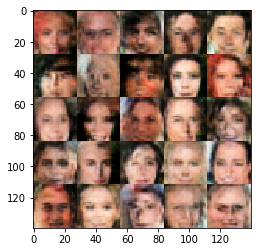

Epoch 1/1... Discriminator Loss: 0.9721... Generator Loss: 1.6489
Epoch 1/1... Discriminator Loss: 1.2615... Generator Loss: 0.8586
Epoch 1/1... Discriminator Loss: 0.9009... Generator Loss: 1.5024
Epoch 1/1... Discriminator Loss: 1.2773... Generator Loss: 0.7064
Epoch 1/1... Discriminator Loss: 1.1545... Generator Loss: 1.1443
Epoch 1/1... Discriminator Loss: 1.2950... Generator Loss: 1.0075
Epoch 1/1... Discriminator Loss: 1.4227... Generator Loss: 0.7486
Epoch 1/1... Discriminator Loss: 1.3540... Generator Loss: 0.6271
Epoch 1/1... Discriminator Loss: 1.3018... Generator Loss: 0.7124
Epoch 1/1... Discriminator Loss: 1.0462... Generator Loss: 1.3463


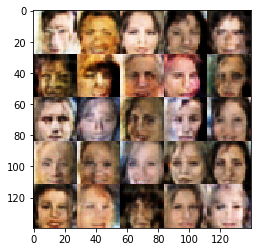

Epoch 1/1... Discriminator Loss: 1.1392... Generator Loss: 0.8480
Epoch 1/1... Discriminator Loss: 1.4810... Generator Loss: 0.6305
Epoch 1/1... Discriminator Loss: 1.2434... Generator Loss: 0.7289
Epoch 1/1... Discriminator Loss: 1.3198... Generator Loss: 0.6832
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.8915
Epoch 1/1... Discriminator Loss: 1.2764... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.5501... Generator Loss: 1.0375
Epoch 1/1... Discriminator Loss: 1.3516... Generator Loss: 0.5890
Epoch 1/1... Discriminator Loss: 1.6324... Generator Loss: 0.4584
Epoch 1/1... Discriminator Loss: 1.4194... Generator Loss: 0.7079


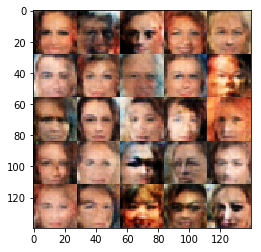

Epoch 1/1... Discriminator Loss: 1.0480... Generator Loss: 0.9994
Epoch 1/1... Discriminator Loss: 1.3928... Generator Loss: 0.8468
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.8743
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.9776
Epoch 1/1... Discriminator Loss: 1.1814... Generator Loss: 0.9078
Epoch 1/1... Discriminator Loss: 1.2162... Generator Loss: 0.7867
Epoch 1/1... Discriminator Loss: 1.3099... Generator Loss: 0.8373
Epoch 1/1... Discriminator Loss: 1.3080... Generator Loss: 0.8388
Epoch 1/1... Discriminator Loss: 1.4771... Generator Loss: 0.5451
Epoch 1/1... Discriminator Loss: 1.0981... Generator Loss: 1.0769


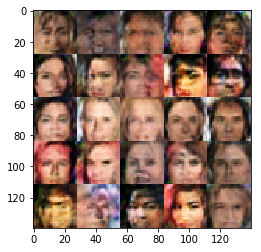

Epoch 1/1... Discriminator Loss: 1.3803... Generator Loss: 0.8313
Epoch 1/1... Discriminator Loss: 1.1652... Generator Loss: 0.9681
Epoch 1/1... Discriminator Loss: 1.4548... Generator Loss: 0.9174
Epoch 1/1... Discriminator Loss: 1.3543... Generator Loss: 0.7615
Epoch 1/1... Discriminator Loss: 1.1879... Generator Loss: 0.7812
Epoch 1/1... Discriminator Loss: 1.3912... Generator Loss: 0.8877
Epoch 1/1... Discriminator Loss: 1.2414... Generator Loss: 1.0571
Epoch 1/1... Discriminator Loss: 1.2199... Generator Loss: 0.8936
Epoch 1/1... Discriminator Loss: 0.6712... Generator Loss: 1.8812
Epoch 1/1... Discriminator Loss: 1.3131... Generator Loss: 0.8768


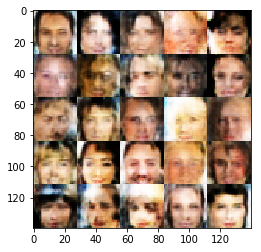

Epoch 1/1... Discriminator Loss: 1.2989... Generator Loss: 0.5625
Epoch 1/1... Discriminator Loss: 1.4012... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.1319... Generator Loss: 1.1932
Epoch 1/1... Discriminator Loss: 1.1057... Generator Loss: 1.3953
Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.7291
Epoch 1/1... Discriminator Loss: 1.3161... Generator Loss: 0.6501
Epoch 1/1... Discriminator Loss: 1.0281... Generator Loss: 1.2445
Epoch 1/1... Discriminator Loss: 1.3935... Generator Loss: 1.0607
Epoch 1/1... Discriminator Loss: 1.3511... Generator Loss: 0.7620
Epoch 1/1... Discriminator Loss: 1.3898... Generator Loss: 0.7079


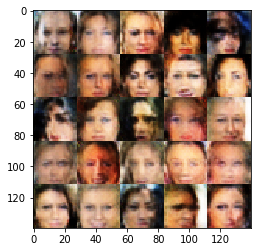

Epoch 1/1... Discriminator Loss: 1.7121... Generator Loss: 0.4052
Epoch 1/1... Discriminator Loss: 1.2102... Generator Loss: 0.9609
Epoch 1/1... Discriminator Loss: 1.2695... Generator Loss: 0.7150
Epoch 1/1... Discriminator Loss: 1.0892... Generator Loss: 1.0555
Epoch 1/1... Discriminator Loss: 1.4999... Generator Loss: 0.8146
Epoch 1/1... Discriminator Loss: 1.3208... Generator Loss: 0.5185
Epoch 1/1... Discriminator Loss: 1.4262... Generator Loss: 0.7193
Epoch 1/1... Discriminator Loss: 1.3435... Generator Loss: 0.6974
Epoch 1/1... Discriminator Loss: 0.8622... Generator Loss: 1.4302
Epoch 1/1... Discriminator Loss: 1.3180... Generator Loss: 1.3203


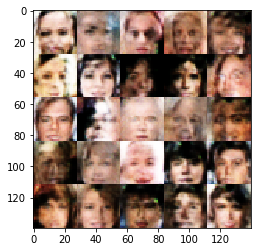

Epoch 1/1... Discriminator Loss: 1.5072... Generator Loss: 0.7376
Epoch 1/1... Discriminator Loss: 1.3836... Generator Loss: 0.8956
Epoch 1/1... Discriminator Loss: 1.3689... Generator Loss: 0.5389
Epoch 1/1... Discriminator Loss: 1.1835... Generator Loss: 0.7846
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.5779
Epoch 1/1... Discriminator Loss: 1.0304... Generator Loss: 1.2134
Epoch 1/1... Discriminator Loss: 1.5214... Generator Loss: 0.9156
Epoch 1/1... Discriminator Loss: 1.3292... Generator Loss: 0.6524
Epoch 1/1... Discriminator Loss: 1.0754... Generator Loss: 1.1023
Epoch 1/1... Discriminator Loss: 1.2238... Generator Loss: 0.6839


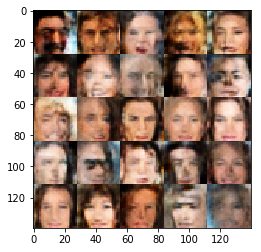

Epoch 1/1... Discriminator Loss: 1.2301... Generator Loss: 0.7667
Epoch 1/1... Discriminator Loss: 1.1847... Generator Loss: 0.9225
Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.8450
Epoch 1/1... Discriminator Loss: 1.4943... Generator Loss: 0.6248
Epoch 1/1... Discriminator Loss: 1.4936... Generator Loss: 0.5936
Epoch 1/1... Discriminator Loss: 1.0491... Generator Loss: 1.3035
Epoch 1/1... Discriminator Loss: 1.2961... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.2317... Generator Loss: 0.4826
Epoch 1/1... Discriminator Loss: 1.3307... Generator Loss: 0.7106
Epoch 1/1... Discriminator Loss: 1.1925... Generator Loss: 0.8998


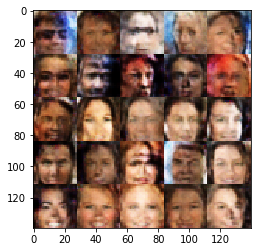

Epoch 1/1... Discriminator Loss: 0.9483... Generator Loss: 1.3980
Epoch 1/1... Discriminator Loss: 1.3022... Generator Loss: 0.8345
Epoch 1/1... Discriminator Loss: 1.4535... Generator Loss: 0.6033
Epoch 1/1... Discriminator Loss: 1.3648... Generator Loss: 0.6180
Epoch 1/1... Discriminator Loss: 1.3665... Generator Loss: 0.5371
Epoch 1/1... Discriminator Loss: 1.3939... Generator Loss: 0.9345
Epoch 1/1... Discriminator Loss: 1.3523... Generator Loss: 0.7057
Epoch 1/1... Discriminator Loss: 1.5025... Generator Loss: 0.6899
Epoch 1/1... Discriminator Loss: 1.1353... Generator Loss: 0.9086
Epoch 1/1... Discriminator Loss: 1.3890... Generator Loss: 0.6532


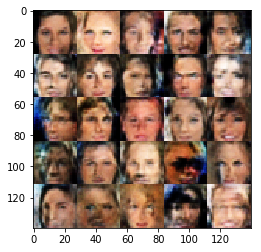

Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.6700
Epoch 1/1... Discriminator Loss: 1.2856... Generator Loss: 0.6689
Epoch 1/1... Discriminator Loss: 1.4594... Generator Loss: 0.8393
Epoch 1/1... Discriminator Loss: 1.4605... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 1.4459... Generator Loss: 0.7215
Epoch 1/1... Discriminator Loss: 1.0737... Generator Loss: 0.7685
Epoch 1/1... Discriminator Loss: 1.2093... Generator Loss: 0.8936
Epoch 1/1... Discriminator Loss: 1.3640... Generator Loss: 0.7718
Epoch 1/1... Discriminator Loss: 1.1412... Generator Loss: 1.0845
Epoch 1/1... Discriminator Loss: 1.2412... Generator Loss: 0.9048


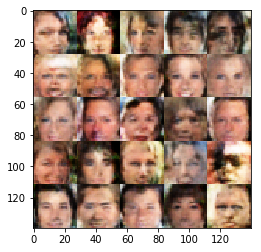

Epoch 1/1... Discriminator Loss: 0.9509... Generator Loss: 1.0572
Epoch 1/1... Discriminator Loss: 1.6272... Generator Loss: 0.8614
Epoch 1/1... Discriminator Loss: 1.2703... Generator Loss: 0.6892
Epoch 1/1... Discriminator Loss: 0.9763... Generator Loss: 1.1502
Epoch 1/1... Discriminator Loss: 1.5759... Generator Loss: 0.4968
Epoch 1/1... Discriminator Loss: 1.2566... Generator Loss: 0.8588
Epoch 1/1... Discriminator Loss: 1.4294... Generator Loss: 0.8712
Epoch 1/1... Discriminator Loss: 1.4129... Generator Loss: 0.7062
Epoch 1/1... Discriminator Loss: 1.2426... Generator Loss: 0.9431
Epoch 1/1... Discriminator Loss: 1.5485... Generator Loss: 0.5535


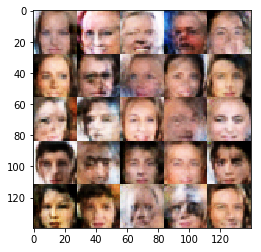

Epoch 1/1... Discriminator Loss: 1.1892... Generator Loss: 0.8863
Epoch 1/1... Discriminator Loss: 1.2342... Generator Loss: 0.9532
Epoch 1/1... Discriminator Loss: 1.2776... Generator Loss: 0.9034
Epoch 1/1... Discriminator Loss: 1.3613... Generator Loss: 0.7752
Epoch 1/1... Discriminator Loss: 1.2376... Generator Loss: 1.1137
Epoch 1/1... Discriminator Loss: 1.3369... Generator Loss: 0.7012
Epoch 1/1... Discriminator Loss: 1.2445... Generator Loss: 0.7099
Epoch 1/1... Discriminator Loss: 1.1902... Generator Loss: 0.6977
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 1.0410
Epoch 1/1... Discriminator Loss: 1.3683... Generator Loss: 0.7824


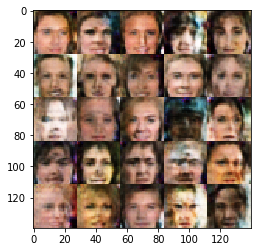

Epoch 1/1... Discriminator Loss: 1.2839... Generator Loss: 0.8344
Epoch 1/1... Discriminator Loss: 0.9686... Generator Loss: 0.9915
Epoch 1/1... Discriminator Loss: 1.2271... Generator Loss: 0.8199
Epoch 1/1... Discriminator Loss: 1.4617... Generator Loss: 1.1381
Epoch 1/1... Discriminator Loss: 1.3643... Generator Loss: 0.7518
Epoch 1/1... Discriminator Loss: 1.4940... Generator Loss: 0.7939
Epoch 1/1... Discriminator Loss: 1.2736... Generator Loss: 0.6272
Epoch 1/1... Discriminator Loss: 1.0856... Generator Loss: 1.1257
Epoch 1/1... Discriminator Loss: 1.4115... Generator Loss: 0.7173
Epoch 1/1... Discriminator Loss: 1.5362... Generator Loss: 0.5306


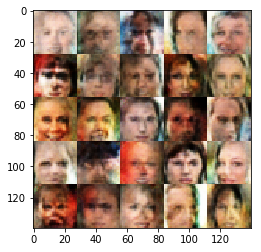

Epoch 1/1... Discriminator Loss: 1.1409... Generator Loss: 0.8420
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.6093
Epoch 1/1... Discriminator Loss: 1.3073... Generator Loss: 0.7726
Epoch 1/1... Discriminator Loss: 1.3958... Generator Loss: 0.6077
Epoch 1/1... Discriminator Loss: 1.0693... Generator Loss: 1.1671
Epoch 1/1... Discriminator Loss: 1.0090... Generator Loss: 0.9675
Epoch 1/1... Discriminator Loss: 1.2070... Generator Loss: 0.7981
Epoch 1/1... Discriminator Loss: 1.2863... Generator Loss: 0.8325
Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.8479
Epoch 1/1... Discriminator Loss: 1.3022... Generator Loss: 0.7328


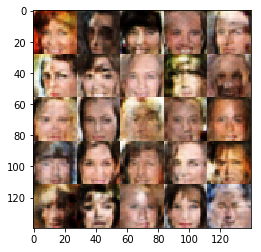

Epoch 1/1... Discriminator Loss: 1.3111... Generator Loss: 0.8169
Epoch 1/1... Discriminator Loss: 1.2658... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 1.1245... Generator Loss: 1.1472
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.5336
Epoch 1/1... Discriminator Loss: 1.2552... Generator Loss: 0.6881
Epoch 1/1... Discriminator Loss: 0.8961... Generator Loss: 1.4936
Epoch 1/1... Discriminator Loss: 1.3568... Generator Loss: 0.6540
Epoch 1/1... Discriminator Loss: 1.2685... Generator Loss: 0.6786
Epoch 1/1... Discriminator Loss: 1.1527... Generator Loss: 0.8270
Epoch 1/1... Discriminator Loss: 1.0288... Generator Loss: 0.9546


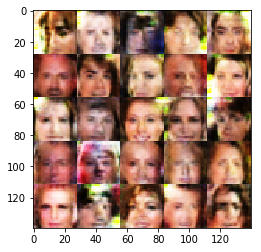

Epoch 1/1... Discriminator Loss: 1.0781... Generator Loss: 0.7694
Epoch 1/1... Discriminator Loss: 1.1189... Generator Loss: 0.6950
Epoch 1/1... Discriminator Loss: 0.6717... Generator Loss: 1.6617
Epoch 1/1... Discriminator Loss: 0.9050... Generator Loss: 1.4424
Epoch 1/1... Discriminator Loss: 1.0825... Generator Loss: 1.3058
Epoch 1/1... Discriminator Loss: 1.2983... Generator Loss: 0.6373
Epoch 1/1... Discriminator Loss: 1.3264... Generator Loss: 1.0409
Epoch 1/1... Discriminator Loss: 1.1436... Generator Loss: 1.1068
Epoch 1/1... Discriminator Loss: 1.8321... Generator Loss: 2.0723
Epoch 1/1... Discriminator Loss: 1.6317... Generator Loss: 0.8612


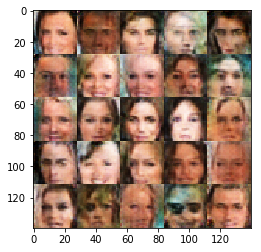

Epoch 1/1... Discriminator Loss: 1.4786... Generator Loss: 0.7974
Epoch 1/1... Discriminator Loss: 1.4047... Generator Loss: 0.9357
Epoch 1/1... Discriminator Loss: 1.3190... Generator Loss: 0.7769
Epoch 1/1... Discriminator Loss: 1.1644... Generator Loss: 0.9928
Epoch 1/1... Discriminator Loss: 1.3882... Generator Loss: 0.6911
Epoch 1/1... Discriminator Loss: 1.3703... Generator Loss: 1.0440
Epoch 1/1... Discriminator Loss: 1.2355... Generator Loss: 1.1808
Epoch 1/1... Discriminator Loss: 1.4872... Generator Loss: 0.7965
Epoch 1/1... Discriminator Loss: 1.1915... Generator Loss: 0.7161
Epoch 1/1... Discriminator Loss: 1.3249... Generator Loss: 0.6370


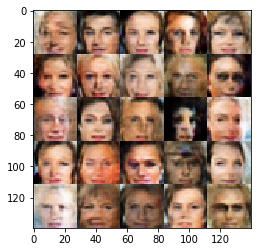

Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.8625
Epoch 1/1... Discriminator Loss: 1.1751... Generator Loss: 0.8906
Epoch 1/1... Discriminator Loss: 1.1592... Generator Loss: 0.9978
Epoch 1/1... Discriminator Loss: 0.9260... Generator Loss: 1.0184
Epoch 1/1... Discriminator Loss: 1.3762... Generator Loss: 0.7688
Epoch 1/1... Discriminator Loss: 1.5656... Generator Loss: 0.5804
Epoch 1/1... Discriminator Loss: 1.4295... Generator Loss: 0.7809
Epoch 1/1... Discriminator Loss: 1.0465... Generator Loss: 1.0594
Epoch 1/1... Discriminator Loss: 1.4790... Generator Loss: 0.9396
Epoch 1/1... Discriminator Loss: 1.3610... Generator Loss: 0.7790


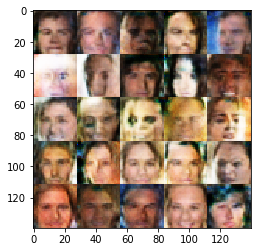

Epoch 1/1... Discriminator Loss: 0.9630... Generator Loss: 1.1691
Epoch 1/1... Discriminator Loss: 1.3744... Generator Loss: 0.7240
Epoch 1/1... Discriminator Loss: 1.3480... Generator Loss: 0.9056
Epoch 1/1... Discriminator Loss: 1.3251... Generator Loss: 0.8900
Epoch 1/1... Discriminator Loss: 1.2131... Generator Loss: 1.0551
Epoch 1/1... Discriminator Loss: 1.2587... Generator Loss: 0.8796
Epoch 1/1... Discriminator Loss: 1.3525... Generator Loss: 0.6990
Epoch 1/1... Discriminator Loss: 1.0465... Generator Loss: 1.1278
Epoch 1/1... Discriminator Loss: 1.3025... Generator Loss: 0.7454
Epoch 1/1... Discriminator Loss: 1.1667... Generator Loss: 1.1617


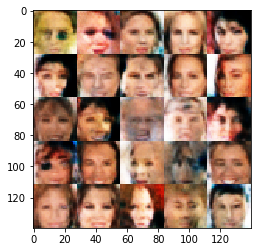

Epoch 1/1... Discriminator Loss: 1.2833... Generator Loss: 0.6895
Epoch 1/1... Discriminator Loss: 0.9775... Generator Loss: 1.0935
Epoch 1/1... Discriminator Loss: 1.1300... Generator Loss: 0.9896
Epoch 1/1... Discriminator Loss: 1.2526... Generator Loss: 0.6282
Epoch 1/1... Discriminator Loss: 1.5012... Generator Loss: 0.6282
Epoch 1/1... Discriminator Loss: 1.5605... Generator Loss: 0.5662
Epoch 1/1... Discriminator Loss: 1.6669... Generator Loss: 0.4974
Epoch 1/1... Discriminator Loss: 1.2564... Generator Loss: 1.0411
Epoch 1/1... Discriminator Loss: 1.0601... Generator Loss: 0.9555
Epoch 1/1... Discriminator Loss: 1.4443... Generator Loss: 0.7668


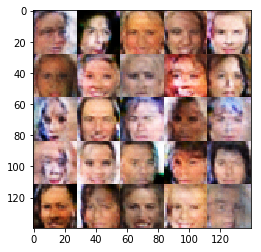

Epoch 1/1... Discriminator Loss: 1.3127... Generator Loss: 0.8451
Epoch 1/1... Discriminator Loss: 1.0983... Generator Loss: 0.9736
Epoch 1/1... Discriminator Loss: 1.3602... Generator Loss: 0.7334
Epoch 1/1... Discriminator Loss: 1.2138... Generator Loss: 1.0307
Epoch 1/1... Discriminator Loss: 1.4814... Generator Loss: 0.7294
Epoch 1/1... Discriminator Loss: 1.2149... Generator Loss: 0.8125
Epoch 1/1... Discriminator Loss: 1.4132... Generator Loss: 0.7587
Epoch 1/1... Discriminator Loss: 1.4978... Generator Loss: 0.8197
Epoch 1/1... Discriminator Loss: 1.2355... Generator Loss: 0.9177
Epoch 1/1... Discriminator Loss: 1.3213... Generator Loss: 0.9975


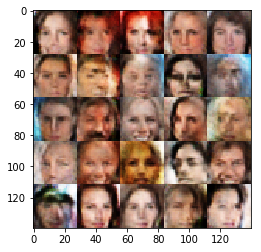

Epoch 1/1... Discriminator Loss: 1.2842... Generator Loss: 0.7389
Epoch 1/1... Discriminator Loss: 1.2565... Generator Loss: 0.7302
Epoch 1/1... Discriminator Loss: 1.2840... Generator Loss: 0.8147
Epoch 1/1... Discriminator Loss: 1.2690... Generator Loss: 0.8427
Epoch 1/1... Discriminator Loss: 1.1697... Generator Loss: 0.8257
Epoch 1/1... Discriminator Loss: 1.2732... Generator Loss: 0.8011
Epoch 1/1... Discriminator Loss: 1.3053... Generator Loss: 1.6325
Epoch 1/1... Discriminator Loss: 1.3647... Generator Loss: 0.7490
Epoch 1/1... Discriminator Loss: 1.5047... Generator Loss: 0.6373
Epoch 1/1... Discriminator Loss: 1.4488... Generator Loss: 0.8408


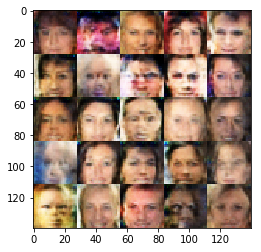

Epoch 1/1... Discriminator Loss: 1.0566... Generator Loss: 0.9893
Epoch 1/1... Discriminator Loss: 1.3240... Generator Loss: 0.8071
Epoch 1/1... Discriminator Loss: 1.3998... Generator Loss: 0.7759
Epoch 1/1... Discriminator Loss: 1.2501... Generator Loss: 0.9388
Epoch 1/1... Discriminator Loss: 1.2881... Generator Loss: 0.6783
Epoch 1/1... Discriminator Loss: 1.3038... Generator Loss: 0.8821
Epoch 1/1... Discriminator Loss: 1.1801... Generator Loss: 1.0378
Epoch 1/1... Discriminator Loss: 1.4368... Generator Loss: 0.6339
Epoch 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.7792
Epoch 1/1... Discriminator Loss: 1.0898... Generator Loss: 0.7934


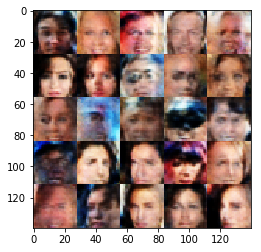

Epoch 1/1... Discriminator Loss: 1.5323... Generator Loss: 0.6526
Epoch 1/1... Discriminator Loss: 1.2660... Generator Loss: 0.7461
Epoch 1/1... Discriminator Loss: 1.4553... Generator Loss: 0.8124
Epoch 1/1... Discriminator Loss: 1.2349... Generator Loss: 0.8240
Epoch 1/1... Discriminator Loss: 1.2593... Generator Loss: 1.0902
Epoch 1/1... Discriminator Loss: 1.2909... Generator Loss: 0.7733
Epoch 1/1... Discriminator Loss: 1.2559... Generator Loss: 0.9289
Epoch 1/1... Discriminator Loss: 1.2469... Generator Loss: 0.8121
Epoch 1/1... Discriminator Loss: 1.1583... Generator Loss: 0.9071
Epoch 1/1... Discriminator Loss: 1.4307... Generator Loss: 0.6235


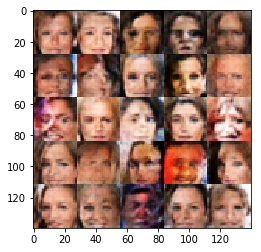

Epoch 1/1... Discriminator Loss: 1.2100... Generator Loss: 0.8834
Epoch 1/1... Discriminator Loss: 1.2608... Generator Loss: 0.8751
Epoch 1/1... Discriminator Loss: 1.2551... Generator Loss: 0.6273
Epoch 1/1... Discriminator Loss: 1.0803... Generator Loss: 1.2862
Epoch 1/1... Discriminator Loss: 1.3133... Generator Loss: 0.8222
Epoch 1/1... Discriminator Loss: 1.1363... Generator Loss: 1.0551
Epoch 1/1... Discriminator Loss: 1.2029... Generator Loss: 1.0258
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.8125
Epoch 1/1... Discriminator Loss: 1.2708... Generator Loss: 0.8212
Epoch 1/1... Discriminator Loss: 1.3509... Generator Loss: 0.8808


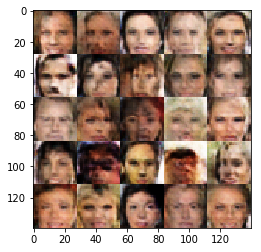

Epoch 1/1... Discriminator Loss: 1.2900... Generator Loss: 0.9158
Epoch 1/1... Discriminator Loss: 1.4592... Generator Loss: 0.6633
Epoch 1/1... Discriminator Loss: 1.3790... Generator Loss: 0.7678
Epoch 1/1... Discriminator Loss: 1.2360... Generator Loss: 0.8477
Epoch 1/1... Discriminator Loss: 1.4302... Generator Loss: 0.7339
Epoch 1/1... Discriminator Loss: 1.2800... Generator Loss: 0.6660
Epoch 1/1... Discriminator Loss: 1.6008... Generator Loss: 0.6671
Epoch 1/1... Discriminator Loss: 1.2181... Generator Loss: 0.8566
Epoch 1/1... Discriminator Loss: 1.3639... Generator Loss: 0.7157
Epoch 1/1... Discriminator Loss: 1.3204... Generator Loss: 0.8295


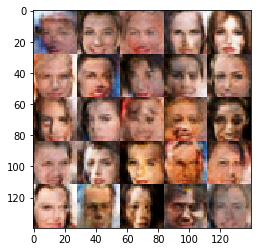

Epoch 1/1... Discriminator Loss: 1.2312... Generator Loss: 0.8359
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.6667
Epoch 1/1... Discriminator Loss: 1.3757... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 1.4372... Generator Loss: 0.8262
Epoch 1/1... Discriminator Loss: 1.5104... Generator Loss: 0.7051
Epoch 1/1... Discriminator Loss: 1.4346... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 1.3791... Generator Loss: 0.7514
Epoch 1/1... Discriminator Loss: 1.3310... Generator Loss: 0.7938
Epoch 1/1... Discriminator Loss: 1.2811... Generator Loss: 0.7303
Epoch 1/1... Discriminator Loss: 1.2811... Generator Loss: 0.9348


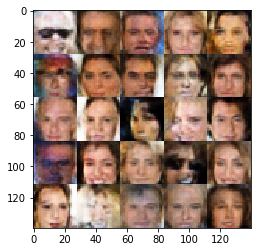

Epoch 1/1... Discriminator Loss: 1.2595... Generator Loss: 0.7962
Epoch 1/1... Discriminator Loss: 1.2936... Generator Loss: 0.7976
Epoch 1/1... Discriminator Loss: 1.3091... Generator Loss: 0.8513
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.9664
Epoch 1/1... Discriminator Loss: 1.2901... Generator Loss: 0.8742
Epoch 1/1... Discriminator Loss: 1.3356... Generator Loss: 0.7006
Epoch 1/1... Discriminator Loss: 1.3175... Generator Loss: 0.9087
Epoch 1/1... Discriminator Loss: 1.4181... Generator Loss: 0.7200
Epoch 1/1... Discriminator Loss: 1.4122... Generator Loss: 0.6629
Epoch 1/1... Discriminator Loss: 1.3783... Generator Loss: 0.6765


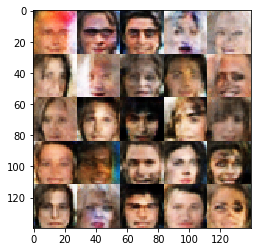

Epoch 1/1... Discriminator Loss: 1.4122... Generator Loss: 0.6351
Epoch 1/1... Discriminator Loss: 1.2064... Generator Loss: 0.9138
Epoch 1/1... Discriminator Loss: 1.2728... Generator Loss: 0.8842
Epoch 1/1... Discriminator Loss: 1.3329... Generator Loss: 0.8664
Epoch 1/1... Discriminator Loss: 1.4574... Generator Loss: 0.6440
Epoch 1/1... Discriminator Loss: 1.4194... Generator Loss: 0.6987
Epoch 1/1... Discriminator Loss: 1.2799... Generator Loss: 0.8191
Epoch 1/1... Discriminator Loss: 1.3208... Generator Loss: 0.7639
Epoch 1/1... Discriminator Loss: 1.4530... Generator Loss: 0.7653
Epoch 1/1... Discriminator Loss: 1.2891... Generator Loss: 1.0232


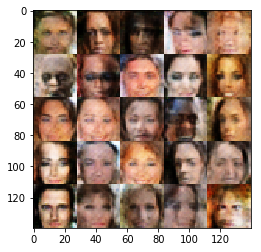

Epoch 1/1... Discriminator Loss: 1.4042... Generator Loss: 0.6521
Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 0.7966
Epoch 1/1... Discriminator Loss: 1.2667... Generator Loss: 0.7343
Epoch 1/1... Discriminator Loss: 1.1903... Generator Loss: 0.8015
Epoch 1/1... Discriminator Loss: 1.3265... Generator Loss: 0.6016
Epoch 1/1... Discriminator Loss: 1.3859... Generator Loss: 0.7516
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.8396
Epoch 1/1... Discriminator Loss: 1.3558... Generator Loss: 0.6800
Epoch 1/1... Discriminator Loss: 1.3768... Generator Loss: 0.7560
Epoch 1/1... Discriminator Loss: 1.3685... Generator Loss: 0.7570


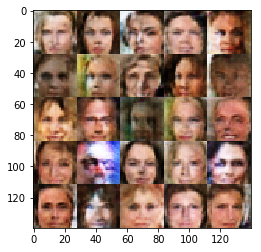

Epoch 1/1... Discriminator Loss: 1.5065... Generator Loss: 0.7104
Epoch 1/1... Discriminator Loss: 1.2926... Generator Loss: 0.7405
Epoch 1/1... Discriminator Loss: 1.4034... Generator Loss: 0.5876
Epoch 1/1... Discriminator Loss: 1.2954... Generator Loss: 0.8262
Epoch 1/1... Discriminator Loss: 1.4562... Generator Loss: 0.9960
Epoch 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.7580
Epoch 1/1... Discriminator Loss: 1.3583... Generator Loss: 0.7703
Epoch 1/1... Discriminator Loss: 1.3067... Generator Loss: 0.7266
Epoch 1/1... Discriminator Loss: 1.4966... Generator Loss: 0.7776
Epoch 1/1... Discriminator Loss: 1.2346... Generator Loss: 0.8924


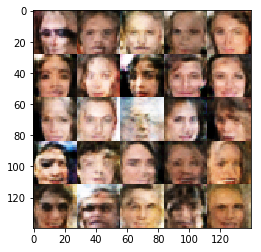

Epoch 1/1... Discriminator Loss: 1.2638... Generator Loss: 0.7549
Epoch 1/1... Discriminator Loss: 1.5496... Generator Loss: 0.6210
Epoch 1/1... Discriminator Loss: 1.4027... Generator Loss: 1.0379
Epoch 1/1... Discriminator Loss: 1.3840... Generator Loss: 0.6138
Epoch 1/1... Discriminator Loss: 1.3855... Generator Loss: 0.6955
Epoch 1/1... Discriminator Loss: 1.2362... Generator Loss: 0.9053
Epoch 1/1... Discriminator Loss: 1.3451... Generator Loss: 0.7477
Epoch 1/1... Discriminator Loss: 1.3921... Generator Loss: 0.5526
Epoch 1/1... Discriminator Loss: 1.2551... Generator Loss: 0.8926
Epoch 1/1... Discriminator Loss: 1.2680... Generator Loss: 0.7951


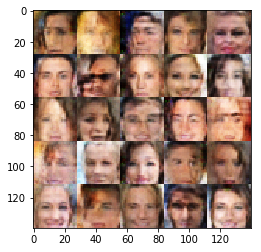

Epoch 1/1... Discriminator Loss: 1.2459... Generator Loss: 0.7048
Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.7805
Epoch 1/1... Discriminator Loss: 1.2033... Generator Loss: 0.8740
Epoch 1/1... Discriminator Loss: 1.3660... Generator Loss: 0.9193
Epoch 1/1... Discriminator Loss: 1.6137... Generator Loss: 0.7311
Epoch 1/1... Discriminator Loss: 1.2621... Generator Loss: 0.8321
Epoch 1/1... Discriminator Loss: 1.4401... Generator Loss: 0.6600
Epoch 1/1... Discriminator Loss: 1.1409... Generator Loss: 1.0958
Epoch 1/1... Discriminator Loss: 1.5539... Generator Loss: 0.5374
Epoch 1/1... Discriminator Loss: 1.2526... Generator Loss: 0.8277


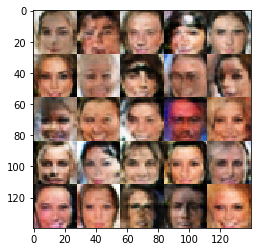

Epoch 1/1... Discriminator Loss: 1.3245... Generator Loss: 0.8114
Epoch 1/1... Discriminator Loss: 1.2759... Generator Loss: 0.9883
Epoch 1/1... Discriminator Loss: 1.2141... Generator Loss: 0.7825
Epoch 1/1... Discriminator Loss: 1.3193... Generator Loss: 0.7146
Epoch 1/1... Discriminator Loss: 1.3702... Generator Loss: 0.6224
Epoch 1/1... Discriminator Loss: 1.4079... Generator Loss: 0.8397
Epoch 1/1... Discriminator Loss: 1.1793... Generator Loss: 0.9979
Epoch 1/1... Discriminator Loss: 1.4656... Generator Loss: 0.7248
Epoch 1/1... Discriminator Loss: 1.2859... Generator Loss: 0.7945
Epoch 1/1... Discriminator Loss: 1.3885... Generator Loss: 0.8394


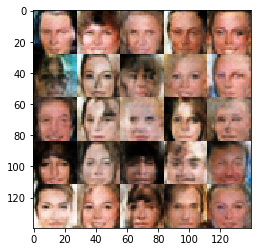

Epoch 1/1... Discriminator Loss: 1.3066... Generator Loss: 0.8470
Epoch 1/1... Discriminator Loss: 1.3266... Generator Loss: 0.6587
Epoch 1/1... Discriminator Loss: 1.4265... Generator Loss: 0.7024
Epoch 1/1... Discriminator Loss: 1.3705... Generator Loss: 0.8013
Epoch 1/1... Discriminator Loss: 1.5065... Generator Loss: 0.6904
Epoch 1/1... Discriminator Loss: 1.2354... Generator Loss: 0.8960
Epoch 1/1... Discriminator Loss: 1.2668... Generator Loss: 0.8598
Epoch 1/1... Discriminator Loss: 1.7827... Generator Loss: 0.6238
Epoch 1/1... Discriminator Loss: 1.4601... Generator Loss: 0.7043
Epoch 1/1... Discriminator Loss: 1.4476... Generator Loss: 0.7174


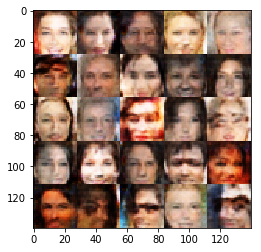

Epoch 1/1... Discriminator Loss: 1.1965... Generator Loss: 0.8407
Epoch 1/1... Discriminator Loss: 1.2273... Generator Loss: 0.7862
Epoch 1/1... Discriminator Loss: 1.3187... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.7916
Epoch 1/1... Discriminator Loss: 1.3593... Generator Loss: 0.7298
Epoch 1/1... Discriminator Loss: 1.2146... Generator Loss: 0.9435
Epoch 1/1... Discriminator Loss: 1.2460... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.1842... Generator Loss: 0.8314
Epoch 1/1... Discriminator Loss: 1.3575... Generator Loss: 0.7408
Epoch 1/1... Discriminator Loss: 1.2781... Generator Loss: 0.9638


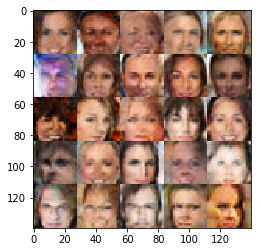

Epoch 1/1... Discriminator Loss: 1.3711... Generator Loss: 0.8310
Epoch 1/1... Discriminator Loss: 1.3514... Generator Loss: 0.6845
Epoch 1/1... Discriminator Loss: 1.3247... Generator Loss: 0.8112
Epoch 1/1... Discriminator Loss: 1.2628... Generator Loss: 0.7649
Epoch 1/1... Discriminator Loss: 1.4548... Generator Loss: 0.6210
Epoch 1/1... Discriminator Loss: 1.4035... Generator Loss: 0.9179
Epoch 1/1... Discriminator Loss: 1.6010... Generator Loss: 0.5892
Epoch 1/1... Discriminator Loss: 1.1802... Generator Loss: 0.9234
Epoch 1/1... Discriminator Loss: 1.1888... Generator Loss: 0.8478
Epoch 1/1... Discriminator Loss: 1.3006... Generator Loss: 1.1178


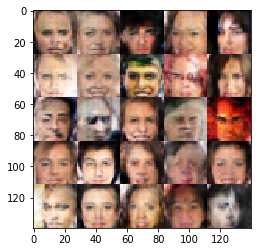

Epoch 1/1... Discriminator Loss: 1.3646... Generator Loss: 0.8832
Epoch 1/1... Discriminator Loss: 1.3191... Generator Loss: 0.7513
Epoch 1/1... Discriminator Loss: 1.2961... Generator Loss: 0.8677
Epoch 1/1... Discriminator Loss: 1.3817... Generator Loss: 0.7862
Epoch 1/1... Discriminator Loss: 1.5185... Generator Loss: 0.7331
Epoch 1/1... Discriminator Loss: 1.3461... Generator Loss: 0.7846
Epoch 1/1... Discriminator Loss: 1.2290... Generator Loss: 0.8270
Epoch 1/1... Discriminator Loss: 1.2722... Generator Loss: 0.7686
Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 0.8811
Epoch 1/1... Discriminator Loss: 1.3513... Generator Loss: 0.8446


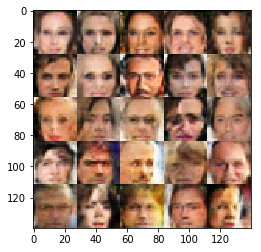

Epoch 1/1... Discriminator Loss: 1.3210... Generator Loss: 0.7610
Epoch 1/1... Discriminator Loss: 1.2902... Generator Loss: 0.9574
Epoch 1/1... Discriminator Loss: 1.3621... Generator Loss: 0.6948
Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.7845
Epoch 1/1... Discriminator Loss: 1.3632... Generator Loss: 0.7758
Epoch 1/1... Discriminator Loss: 1.2906... Generator Loss: 0.8352
Epoch 1/1... Discriminator Loss: 1.2889... Generator Loss: 0.6286
Epoch 1/1... Discriminator Loss: 1.3125... Generator Loss: 0.8450
Epoch 1/1... Discriminator Loss: 1.5320... Generator Loss: 0.7037
Epoch 1/1... Discriminator Loss: 1.2823... Generator Loss: 0.7414


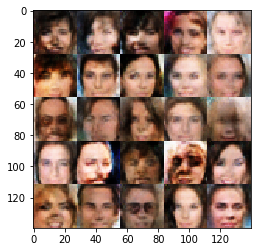

Epoch 1/1... Discriminator Loss: 1.4018... Generator Loss: 0.9455
Epoch 1/1... Discriminator Loss: 1.3678... Generator Loss: 0.6562
Epoch 1/1... Discriminator Loss: 1.5732... Generator Loss: 0.6555
Epoch 1/1... Discriminator Loss: 1.4983... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.3045... Generator Loss: 0.6620
Epoch 1/1... Discriminator Loss: 1.2023... Generator Loss: 0.8293
Epoch 1/1... Discriminator Loss: 1.2187... Generator Loss: 0.9281
Epoch 1/1... Discriminator Loss: 1.3577... Generator Loss: 0.7495
Epoch 1/1... Discriminator Loss: 1.4903... Generator Loss: 0.7042
Epoch 1/1... Discriminator Loss: 1.3667... Generator Loss: 0.8731


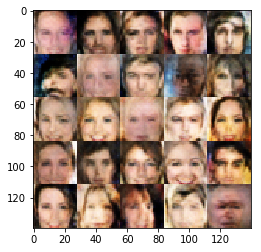

Epoch 1/1... Discriminator Loss: 1.3202... Generator Loss: 0.8192
Epoch 1/1... Discriminator Loss: 1.2640... Generator Loss: 0.7700
Epoch 1/1... Discriminator Loss: 1.3984... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.8662
Epoch 1/1... Discriminator Loss: 1.2870... Generator Loss: 0.9034
Epoch 1/1... Discriminator Loss: 1.2418... Generator Loss: 0.7935
Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.8827
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.6134
Epoch 1/1... Discriminator Loss: 1.3504... Generator Loss: 0.7408
Epoch 1/1... Discriminator Loss: 1.3609... Generator Loss: 0.8053


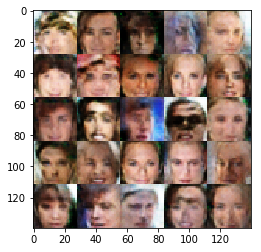

Epoch 1/1... Discriminator Loss: 1.2643... Generator Loss: 0.9879
Epoch 1/1... Discriminator Loss: 1.3840... Generator Loss: 0.8390
Epoch 1/1... Discriminator Loss: 1.3331... Generator Loss: 0.8383
Epoch 1/1... Discriminator Loss: 1.0400... Generator Loss: 1.1649
Epoch 1/1... Discriminator Loss: 1.1842... Generator Loss: 0.7597
Epoch 1/1... Discriminator Loss: 1.2909... Generator Loss: 0.8264
Epoch 1/1... Discriminator Loss: 1.2570... Generator Loss: 0.7198
Epoch 1/1... Discriminator Loss: 1.2381... Generator Loss: 0.7822
Epoch 1/1... Discriminator Loss: 1.2298... Generator Loss: 0.8335
Epoch 1/1... Discriminator Loss: 1.2324... Generator Loss: 0.7856


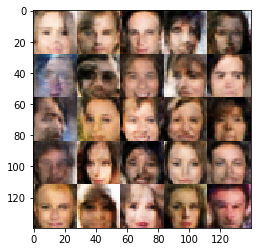

Epoch 1/1... Discriminator Loss: 1.2323... Generator Loss: 0.9621
Epoch 1/1... Discriminator Loss: 1.3470... Generator Loss: 0.8379
Epoch 1/1... Discriminator Loss: 1.3039... Generator Loss: 0.7203
Epoch 1/1... Discriminator Loss: 1.1208... Generator Loss: 0.9742
Epoch 1/1... Discriminator Loss: 1.2819... Generator Loss: 0.7552
Epoch 1/1... Discriminator Loss: 1.2897... Generator Loss: 0.6568
Epoch 1/1... Discriminator Loss: 1.3336... Generator Loss: 0.7371
Epoch 1/1... Discriminator Loss: 1.3433... Generator Loss: 0.8366
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.8898
Epoch 1/1... Discriminator Loss: 1.2337... Generator Loss: 0.7521


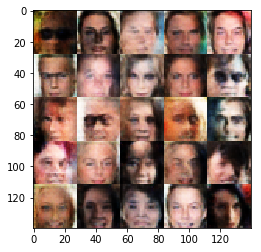

Epoch 1/1... Discriminator Loss: 1.3665... Generator Loss: 0.7636
Epoch 1/1... Discriminator Loss: 1.3368... Generator Loss: 0.7481
Epoch 1/1... Discriminator Loss: 1.3291... Generator Loss: 0.5629
Epoch 1/1... Discriminator Loss: 1.3348... Generator Loss: 0.7787
Epoch 1/1... Discriminator Loss: 1.3434... Generator Loss: 0.8102
Epoch 1/1... Discriminator Loss: 1.4877... Generator Loss: 0.6096
Epoch 1/1... Discriminator Loss: 1.3241... Generator Loss: 0.8308
Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.8324
Epoch 1/1... Discriminator Loss: 1.5163... Generator Loss: 0.8228
Epoch 1/1... Discriminator Loss: 1.2975... Generator Loss: 0.8073


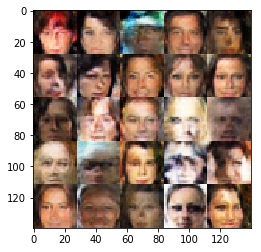

Epoch 1/1... Discriminator Loss: 1.4052... Generator Loss: 0.6867
Epoch 1/1... Discriminator Loss: 1.5030... Generator Loss: 0.6148
Epoch 1/1... Discriminator Loss: 1.2542... Generator Loss: 0.8242
Epoch 1/1... Discriminator Loss: 1.3300... Generator Loss: 0.8336
Epoch 1/1... Discriminator Loss: 1.4228... Generator Loss: 0.8420
Epoch 1/1... Discriminator Loss: 1.4040... Generator Loss: 0.8023
Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.8268
Epoch 1/1... Discriminator Loss: 1.4023... Generator Loss: 0.7038
Epoch 1/1... Discriminator Loss: 1.3132... Generator Loss: 1.0927
Epoch 1/1... Discriminator Loss: 1.0851... Generator Loss: 0.9344


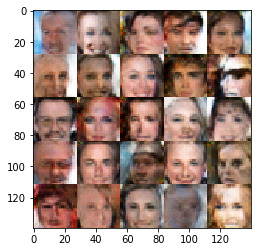

Epoch 1/1... Discriminator Loss: 1.5493... Generator Loss: 0.6986
Epoch 1/1... Discriminator Loss: 1.3517... Generator Loss: 0.9456
Epoch 1/1... Discriminator Loss: 1.4335... Generator Loss: 0.6296
Epoch 1/1... Discriminator Loss: 1.4209... Generator Loss: 0.6821
Epoch 1/1... Discriminator Loss: 1.3324... Generator Loss: 0.6522
Epoch 1/1... Discriminator Loss: 1.4357... Generator Loss: 0.9013
Epoch 1/1... Discriminator Loss: 1.2942... Generator Loss: 0.7857
Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.9745
Epoch 1/1... Discriminator Loss: 1.1727... Generator Loss: 0.8822
Epoch 1/1... Discriminator Loss: 1.3699... Generator Loss: 0.7967


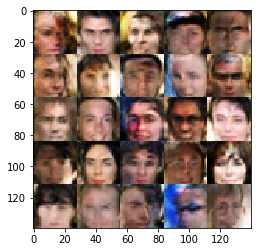

Epoch 1/1... Discriminator Loss: 1.3333... Generator Loss: 0.6077
Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 0.9930
Epoch 1/1... Discriminator Loss: 1.5376... Generator Loss: 0.9148
Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.8907
Epoch 1/1... Discriminator Loss: 1.2849... Generator Loss: 0.8046
Epoch 1/1... Discriminator Loss: 1.2561... Generator Loss: 0.6639
Epoch 1/1... Discriminator Loss: 1.1506... Generator Loss: 0.9504
Epoch 1/1... Discriminator Loss: 1.3751... Generator Loss: 0.9431
Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.8293
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.6956


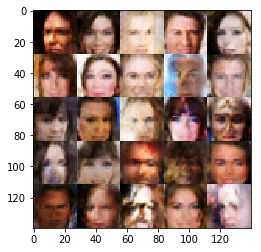

Epoch 1/1... Discriminator Loss: 1.2956... Generator Loss: 0.8676
Epoch 1/1... Discriminator Loss: 1.3448... Generator Loss: 0.7705
Epoch 1/1... Discriminator Loss: 1.4508... Generator Loss: 0.7601
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.6341
Epoch 1/1... Discriminator Loss: 1.5855... Generator Loss: 0.5845
Epoch 1/1... Discriminator Loss: 1.4603... Generator Loss: 0.6614
Epoch 1/1... Discriminator Loss: 1.1960... Generator Loss: 0.9716
Epoch 1/1... Discriminator Loss: 1.3644... Generator Loss: 0.7750
Epoch 1/1... Discriminator Loss: 1.2750... Generator Loss: 0.8820
Epoch 1/1... Discriminator Loss: 1.3126... Generator Loss: 0.7581


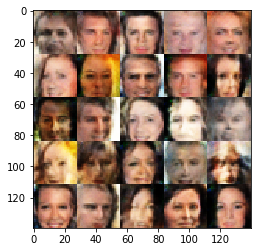

Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.7872
Epoch 1/1... Discriminator Loss: 1.4079... Generator Loss: 0.6454
Epoch 1/1... Discriminator Loss: 1.1820... Generator Loss: 0.7749
Epoch 1/1... Discriminator Loss: 1.2199... Generator Loss: 0.8113
Epoch 1/1... Discriminator Loss: 1.3434... Generator Loss: 0.7380
Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 0.6447
Epoch 1/1... Discriminator Loss: 1.3799... Generator Loss: 0.7037
Epoch 1/1... Discriminator Loss: 1.3725... Generator Loss: 0.8559
Epoch 1/1... Discriminator Loss: 1.3602... Generator Loss: 0.6981
Epoch 1/1... Discriminator Loss: 1.4799... Generator Loss: 0.7585


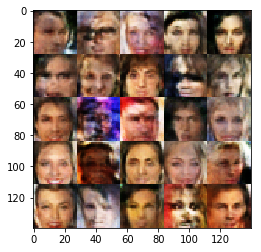

Epoch 1/1... Discriminator Loss: 1.3953... Generator Loss: 0.8342
Epoch 1/1... Discriminator Loss: 1.4328... Generator Loss: 0.7882
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.7500
Epoch 1/1... Discriminator Loss: 1.4044... Generator Loss: 0.8416
Epoch 1/1... Discriminator Loss: 1.3679... Generator Loss: 0.7117
Epoch 1/1... Discriminator Loss: 1.3211... Generator Loss: 0.8120
Epoch 1/1... Discriminator Loss: 1.4166... Generator Loss: 0.5843
Epoch 1/1... Discriminator Loss: 1.4615... Generator Loss: 0.8676
Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.9219
Epoch 1/1... Discriminator Loss: 1.3843... Generator Loss: 0.6710


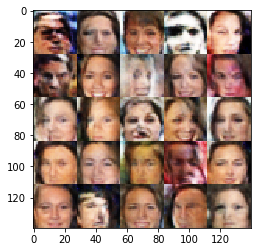

Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.6928
Epoch 1/1... Discriminator Loss: 1.4405... Generator Loss: 0.7003
Epoch 1/1... Discriminator Loss: 1.2235... Generator Loss: 0.9638
Epoch 1/1... Discriminator Loss: 1.3637... Generator Loss: 0.7372
Epoch 1/1... Discriminator Loss: 1.3104... Generator Loss: 0.7624
Epoch 1/1... Discriminator Loss: 1.2654... Generator Loss: 0.7368
Epoch 1/1... Discriminator Loss: 1.3561... Generator Loss: 0.6435
Epoch 1/1... Discriminator Loss: 1.4165... Generator Loss: 0.6693
Epoch 1/1... Discriminator Loss: 1.5216... Generator Loss: 0.7237
Epoch 1/1... Discriminator Loss: 1.3191... Generator Loss: 0.6638


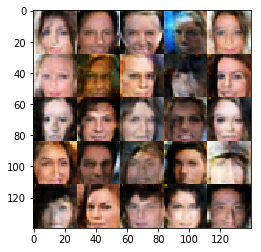

Epoch 1/1... Discriminator Loss: 1.3499... Generator Loss: 0.9145
Epoch 1/1... Discriminator Loss: 1.1914... Generator Loss: 0.9662
Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.8207
Epoch 1/1... Discriminator Loss: 1.2880... Generator Loss: 0.8759
Epoch 1/1... Discriminator Loss: 1.4097... Generator Loss: 0.6784
Epoch 1/1... Discriminator Loss: 1.3231... Generator Loss: 0.7460
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.6709
Epoch 1/1... Discriminator Loss: 1.4097... Generator Loss: 0.6310
Epoch 1/1... Discriminator Loss: 1.2456... Generator Loss: 0.8815
Epoch 1/1... Discriminator Loss: 1.4352... Generator Loss: 0.7850


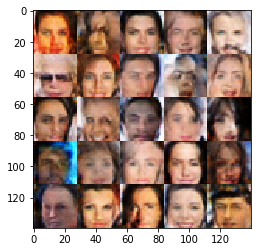

Epoch 1/1... Discriminator Loss: 1.3620... Generator Loss: 0.9787
Epoch 1/1... Discriminator Loss: 1.4276... Generator Loss: 0.7036
Epoch 1/1... Discriminator Loss: 1.2291... Generator Loss: 0.8129
Epoch 1/1... Discriminator Loss: 1.3697... Generator Loss: 0.7795
Epoch 1/1... Discriminator Loss: 1.2991... Generator Loss: 0.8037
Epoch 1/1... Discriminator Loss: 1.2572... Generator Loss: 0.9947
Epoch 1/1... Discriminator Loss: 1.3175... Generator Loss: 0.6953
Epoch 1/1... Discriminator Loss: 1.3097... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.2919... Generator Loss: 0.7666
Epoch 1/1... Discriminator Loss: 1.2623... Generator Loss: 0.7363


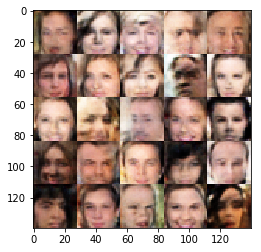

Epoch 1/1... Discriminator Loss: 1.3055... Generator Loss: 0.8273
Epoch 1/1... Discriminator Loss: 1.3036... Generator Loss: 0.8091
Epoch 1/1... Discriminator Loss: 1.2318... Generator Loss: 0.8497
Epoch 1/1... Discriminator Loss: 1.5151... Generator Loss: 0.7142
Epoch 1/1... Discriminator Loss: 1.3611... Generator Loss: 0.7887
Epoch 1/1... Discriminator Loss: 1.3007... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 1.4425... Generator Loss: 0.8001
Epoch 1/1... Discriminator Loss: 1.2838... Generator Loss: 0.8307
Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.7132
Epoch 1/1... Discriminator Loss: 1.3159... Generator Loss: 0.7170


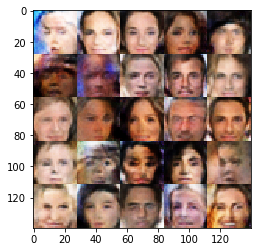

Epoch 1/1... Discriminator Loss: 1.4211... Generator Loss: 0.8260
Epoch 1/1... Discriminator Loss: 1.3137... Generator Loss: 0.8062
Epoch 1/1... Discriminator Loss: 1.3471... Generator Loss: 0.8436
Epoch 1/1... Discriminator Loss: 1.5906... Generator Loss: 0.7126
Epoch 1/1... Discriminator Loss: 1.1968... Generator Loss: 0.8907
Epoch 1/1... Discriminator Loss: 1.4183... Generator Loss: 0.7424
Epoch 1/1... Discriminator Loss: 1.3406... Generator Loss: 0.9383
Epoch 1/1... Discriminator Loss: 1.2155... Generator Loss: 0.8335
Epoch 1/1... Discriminator Loss: 1.5326... Generator Loss: 0.6171
Epoch 1/1... Discriminator Loss: 1.4394... Generator Loss: 0.8502


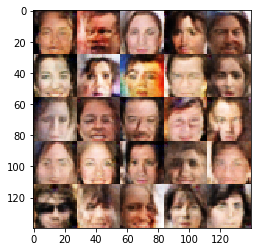

Epoch 1/1... Discriminator Loss: 1.3034... Generator Loss: 0.8218
Epoch 1/1... Discriminator Loss: 1.4179... Generator Loss: 0.7469
Epoch 1/1... Discriminator Loss: 1.5446... Generator Loss: 0.7219


In [ ]:

batch_size = 32 
z_dim = 100
learning_rate = 0.0004
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.